In [2]:
import re
import numpy as np

def extract_values(filename, variable_name):
    with open(filename, 'r') as file:
        file_text = file.read()

    pattern = rf'{variable_name}=\s*\[(.*?)\]'
    values = re.findall(pattern, file_text, re.MULTILINE | re.DOTALL)
    # values = [list(map(float, theta.replace('\n', ' ').split())) for theta in values]

    values = [re.findall(r'-?\d+(?:\.\d+)?(?:[eE][-+]?\d+)?', w) for w in values]
    values = [[float(num) for num in w] for w in values]
    return np.array(values)

import mdtraj as md
def extract_consecutive_parts(arr):
    mask = np.insert(np.diff(arr) != 1, 0, True)
    indices = np.where(mask)[0]

    # Check if the first element is part of a consecutive sequence
    if arr[0] - 1 not in arr:
        indices = indices[1:]

    consecutive_parts = np.split(arr, indices)
    return consecutive_parts

class CVgenerator:
    # initialization
    def __init__(self, pdb_structure, windows_size='auto', steps='auto', mode='regular'):
        self.struc = pdb_structure
        struc = md.load_pdb(pdb_structure)
        n_residues = struc.topology.n_residues
        if windows_size=='auto' and steps=='auto':
            self.windows_size = np.arange(5,n_residues,4)
            self.steps = np.round(self.windows_size/2).astype(int)
            # self.steps = np.array([2]*self.windows_size.shape[0])
            if self.windows_size[-1]!=n_residues:
                self.windows_size = np.append(self.windows_size,n_residues)
                self.steps = np.append(self.steps,n_residues)
            
        else:
            self.windows_size = windows_size
            self.steps = steps

        self.mode = mode
        
    def generateCV(self):
        struc = md.load_pdb(self.struc)
        n_residues = struc.topology.n_residues
        ref_dssp_code = md.compute_dssp(struc, simplified=False)
        flag_alpha = False
        flag_beta = False
        alpha_res_index = np.where(ref_dssp_code[0]=='H')
        if alpha_res_index[0].shape[0]>0:
            alpha_res = extract_consecutive_parts(alpha_res_index[0])
            flag_alpha = True
        beta_res_index = np.where(ref_dssp_code[0]=='E')
        if beta_res_index[0].shape[0]>0:
            beta_res = extract_consecutive_parts(beta_res_index[0])
            flag_beta = True
        heavy = struc.topology.select_atom_indices('heavy')
        alpha = struc.topology.select_atom_indices('alpha')
        important_atoms = alpha
        CV_indices = []
        CV_residues_index = []
        CV_struc_indices = []
        exclude_beta_strand = False
        if self.mode=='regular':
            if exclude_beta_strand:
                arr_scope = np.where(ref_dssp_code[0]!='E')[0]
                arrs_in = extract_consecutive_parts(arr_scope)
                filt_arrs_in = [i for i in arrs_in if i.shape[0]>3]
                for size,step in zip(self.windows_size,self.steps):
                    arrs_out = []
                    for arr in filt_arrs_in:
                        arrs_out += self.generate_sliding_windows(arr,size,step)
                    for ress in arrs_out:
                        resi_indices = struc.topology.select('resi '+' '.join(str(i) for i in ress))
                        if not any(np.array_equal(resi_indices, arr) for arr in CV_struc_indices):
                            CV_struc_indices.append(resi_indices)
                        sel_indices = np.intersect1d(important_atoms,resi_indices)
                        if not any(np.array_equal(sel_indices, arr) for arr in CV_indices):
                            CV_indices.append(sel_indices)
                            CV_residues_index.append(ress)
            else:
                arrs_in = np.arange(n_residues)
                for size,step in zip(self.windows_size,self.steps):
                    arrs_out = self.generate_sliding_windows(arrs_in,size,step)
                    for ress in arrs_out:
                        resi_indices = struc.topology.select('resi '+' '.join(str(i) for i in ress))
                        if not any(np.array_equal(resi_indices, arr) for arr in CV_struc_indices):
                            CV_struc_indices.append(resi_indices)
                        sel_indices = np.intersect1d(important_atoms,resi_indices)
                        if not any(np.array_equal(sel_indices, arr) for arr in CV_indices):
                            CV_indices.append(sel_indices)
                            CV_residues_index.append(ress)
            if flag_beta:
                cv_indices, cv_struc_indices, cv_residues_index  = self.find_beta(struc, beta_res, important_atoms)
                CV_indices += cv_indices
                CV_residues_index += cv_residues_index
                CV_struc_indices += cv_struc_indices
            
        elif self.mode=='structure':            
            if flag_alpha:
                cv_indices, cv_struc_indices, cv_residues_index = self.find_alpha(struc, alpha_res, important_atoms)
                CV_indices += cv_indices
                CV_residues_index += cv_residues_index
                CV_struc_indices += cv_struc_indices
            if flag_beta:
                cv_indices, cv_struc_indices, cv_residues_index  = self.find_beta(struc, beta_res, important_atoms)
                CV_indices += cv_indices
                CV_residues_index += cv_residues_index
                CV_struc_indices += cv_struc_indices 

        return CV_indices, CV_residues_index
        
    def generate_sliding_windows(self, arr_in, window_size, step):
        if len(arr_in) <= window_size:
            arrs_out = [list(arr_in)]
        else:
            arrs_out = []
            for i in range(0, len(arr_in) - window_size + 1, step):
                window = arr_in[i:i+window_size]
                arrs_out.append(list(window))
            
            # Include the last window if it is not complete
            # if len(arr_in) % step != 0:
            #     window = arr_in[-window_size:]
            #     arrs_out.append(list(window))
            
            if arrs_out[-1][-1] != arr_in[-1]:
                window = arr_in[-window_size:]
                arrs_out.append(list(window))
        
        return arrs_out
    
    def find_alpha(self, struc, alpha_res, important_atoms):
        alpha_level_struc = []
        CV_indices = []
        CV_residues_index = []
        CV_struc_indices = []
        for size,step in zip(self.windows_size,self.steps):
            for ress in alpha_res:
                if size>=ress.shape[0]:
                    if any(np.array_equal(ress, np.array(arr)) for arr in alpha_level_struc):
                        continue
                    else:
                        alpha_level_struc.append(list(ress))
                else:
                    arrs_out = self.generate_sliding_windows(ress,size,step)
                    alpha_level_struc += arrs_out
        for single_alpha in alpha_res:
            if not any(np.array_equal(single_alpha, np.array(arr)) for arr in alpha_level_struc):
                alpha_level_struc.append(single_alpha)

        n_seg = len(alpha_res)
        if n_seg>=2:
            for seg in range(2,n_seg+1):
                for i in range(0,n_seg-seg+1):
                    window = np.arange(alpha_res[i][0],alpha_res[i+seg-1][-1]+1)
                    alpha_level_struc.append(list(window))
        alpha_indices = []
        for ress in alpha_level_struc:
            resi_indices = struc.topology.select('resi '+' '.join(str(i) for i in ress))
            CV_struc_indices.append(resi_indices)
            sel_indices = np.intersect1d(important_atoms,resi_indices)
            alpha_indices.append(sel_indices)
            CV_residues_index.append(ress)
        CV_indices += alpha_indices
        return CV_indices, CV_struc_indices, CV_residues_index
    
    def find_beta(self, struc, beta_res, important_atoms):
        hbonds_lst = md.baker_hubbard(struc,distance_cutoff=0.25)
        res2atom = []
        CV_indices = []
        CV_residues_index = []
        CV_struc_indices = []
        for i in range(struc.top.n_residues):
            at1 = struc.top.select('resid '+str(i))[0]
            at2 = struc.top.select('resid '+str(i))[-1]
            res2atom.append([at1,at2])
        # Create a list of coarse-grained hydrogen bonds represented by pairs of amino acids.
        res_hbonds = []
        for hbond in hbonds_lst:
            donor = hbond[0]
            acc = hbond[2]
            res_hbond = [0,0]
            for n,at in enumerate(res2atom):
                if at[0]<=donor<=at[1]:
                    res_hbond[0] = n
                elif at[0]<=acc<=at[1]:
                    res_hbond[1] = n
            res_hbonds.append(np.array(res_hbond))
        res_hbonds = np.array(res_hbonds)
        res_hbonds_beta = []    # coarse-grained hbond represented by residue pairs
        for hbond in res_hbonds:
            if sum(np.isin(np.concatenate(beta_res), hbond[0]))\
                and sum(np.isin(np.concatenate(beta_res), hbond[1])):
                res_hbonds_beta.append(hbond)
        beta_pair = []
        for pair in res_hbonds_beta:
            ind = [-1, -1]
            for n,lst in enumerate(beta_res):
                if sum(np.isin(lst,pair[0])):
                    ind[0] = n
                elif sum(np.isin(lst,pair[1])):
                    ind[1] = n
            beta_pair.append(np.sort(np.array(ind)))
        beta_pair = np.unique(beta_pair, axis=0)

        beta_strand_lens = [i.shape[0] for i in beta_res]
        max_beta_strand = np.max(beta_strand_lens)
        beta_windows_sizes = np.arange(4,max_beta_strand+2,2)
        beta_steps = np.round(beta_windows_sizes/2).astype(int)
        beta_level_struc = []
        for pair in beta_pair:
            # align the beta-strand, make them same length
            sel_segs = [beta_res[pair[0]],beta_res[pair[1]]]
            iden = [beta_res[pair[0]].shape[0],beta_res[pair[1]].shape[0]]
            if beta_res[pair[0]].shape[0] != beta_res[pair[1]].shape[0]:
                big_seg = sel_segs[np.argmax(iden)]
                small_seg = sel_segs[np.argmin(iden)]
                
                seg_len = small_seg.shape[0]
                segs = self.generate_sliding_windows(big_seg,seg_len,1)
                segs_dis = []
                for seg in segs:
                    import itertools
                    pairs = list(itertools.product(seg, small_seg))
                    distances = md.compute_contacts(struc, pairs)
                    segs_dis.append(np.mean(np.min(distances[0].reshape(seg_len,seg_len),axis=1)))
                sel_seg = segs[np.argmin(segs_dis)]
                sel_segs = [small_seg,sel_seg]
            # align the beta-strand, make them paralelle aligned
            pair_res_dis1 = md.compute_contacts(struc, [(sel_segs[0][0],sel_segs[1][0])])
            pair_res_dis2 = md.compute_contacts(struc, [(sel_segs[0][0],sel_segs[1][-1])])
            if pair_res_dis2 < pair_res_dis1:
                sel_segs[1] = sel_segs[1][::-1]
                
            
            for size,step in zip(beta_windows_sizes,beta_steps):
                if size>=sel_segs[0].shape[0]:
                    if any(np.array_equal(np.concatenate(sel_segs), np.array(arr)) for arr in beta_level_struc):
                            continue
                    else:
                        beta_level_struc.append(list(np.concatenate(sel_segs)))
                else:
                    arrs_out1 = self.generate_sliding_windows(sel_segs[0],size,step)
                    arrs_out2 = self.generate_sliding_windows(sel_segs[1],size,step)
                    beta_level_struc += [list(np.concatenate([arrs_out1[i],arrs_out2[i]])) for i in range(len(arrs_out1))]

        beta_indices = []
        for ress in beta_level_struc:
            resi_indices = struc.topology.select('resi '+' '.join(str(i) for i in ress))
            CV_struc_indices.append(resi_indices)
            sel_indices = np.intersect1d(important_atoms,resi_indices)
            beta_indices.append(sel_indices)
            CV_residues_index.append(ress)
        CV_indices += beta_indices
        return CV_indices, CV_struc_indices, CV_residues_index
    
def best_hummer_q(traj, native):
    """Compute the fraction of native contacts according the definition from
    Best, Hummer and Eaton [1]
    
    Parameters
    ----------
    traj : md.Trajectory
        The trajectory to do the computation for
    native : md.Trajectory
        The 'native state'. This can be an entire trajecory, or just a single frame.
        Only the first conformation is used
        
    Returns
    -------
    q : np.array, shape=(len(traj),)
        The fraction of native contacts in each frame of `traj`
        
    References
    ----------
    ..[1] Best, Hummer, and Eaton, "Native contacts determine protein folding
          mechanisms in atomistic simulations" PNAS (2013)
    """
    import warnings
    import mdtraj as md
    import numpy as np
    from itertools import combinations

    BETA_CONST = 50  # 1/nm
    LAMBDA_CONST = 1.8
    NATIVE_CUTOFF = 0.45  # nanometers
    
    # get the indices of all of the heavy atoms
    heavy = native.topology.select_atom_indices('heavy')
    # get the pairs of heavy atoms which are farther than 3
    # residues apart
    heavy_pairs = np.array(
        [(i,j) for (i,j) in combinations(heavy, 2)
            if abs(native.topology.atom(i).residue.index - \
                   native.topology.atom(j).residue.index) > 3])
    
    # compute the distances between these pairs in the native state
    heavy_pairs_distances = md.compute_distances(native[0], heavy_pairs)[0]
    # and get the pairs s.t. the distance is less than NATIVE_CUTOFF
    native_contacts = heavy_pairs[heavy_pairs_distances < NATIVE_CUTOFF]
    # print("Number of native contacts", len(native_contacts))
    
    # now compute these distances for the whole trajectory
    r = md.compute_distances(traj, native_contacts)
    # and recompute them for just the native state
    r0 = md.compute_distances(native[0], native_contacts)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        q = np.mean(1.0 / (1 + np.exp(BETA_CONST * (r - LAMBDA_CONST * r0))), axis=1)
    return q

#### Adaptive CVgen 300K

In [10]:
alpha_rmsd = []
Q = []
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
base_dir = './iTOL_plot/'
whole_struc_ind = []
for i,protein_name in enumerate(protein_lst):
    alpha_rmsd.append([])
    native_ref = md.load_pdb(base_dir+protein_name+'/p.pdb')
    n_resi = native_ref.topology.n_residues
    traj = md.load_dcd('./data/'+protein_name+'/'+protein_name+'.dcd', top=base_dir+protein_name+'/p.pdb')
    cvgenerator_ts = CVgenerator(base_dir+protein_name+'/p.pdb',windows_size='auto',steps='auto',mode='regular')
    sel_indices, CV_residues_index = cvgenerator_ts.generateCV()
    for sel_indice in sel_indices:
        rmsd = md.rmsd(traj, native_ref, atom_indices=sel_indice)
        alpha_rmsd[i].append(rmsd*10)
    
    cv_len = np.array([len(CV) for CV in CV_residues_index])
    whole_struc_ind.append(np.where(cv_len==n_resi)[0])
    
    q = best_hummer_q(traj, native_ref)
    Q.append(q)

In [11]:
folded_state_rmsd = []
min_rmsd = []
folded_state_q = []
max_q = []
i = 0
for rmsd,q in zip(alpha_rmsd,Q):
    rcut = np.min(rmsd[whole_struc_ind[i][0]])+0.1
    qcut = np.max(q)-0.01
    folded_state_rmsd.append(np.where(rmsd[whole_struc_ind[i][0]]<rcut)[0][0])
    folded_state_q.append(np.where(q>qcut)[0][0])
    min_rmsd.append(np.min(rmsd[whole_struc_ind[i][0]]))
    max_q.append(np.max(q))
    i += 1

print(folded_state_rmsd)
print(folded_state_q)

[194406, 149592, 257750, 167827, 225212, 354565]
[158874, 139453, 346503, 163797, 169477, 530474]


minimum rmsd =  1.3195679
minimum rmsd =  0.5689981
minimum rmsd =  1.6194322
minimum rmsd =  0.39128798
minimum rmsd =  2.0002172
minimum rmsd =  2.0076299


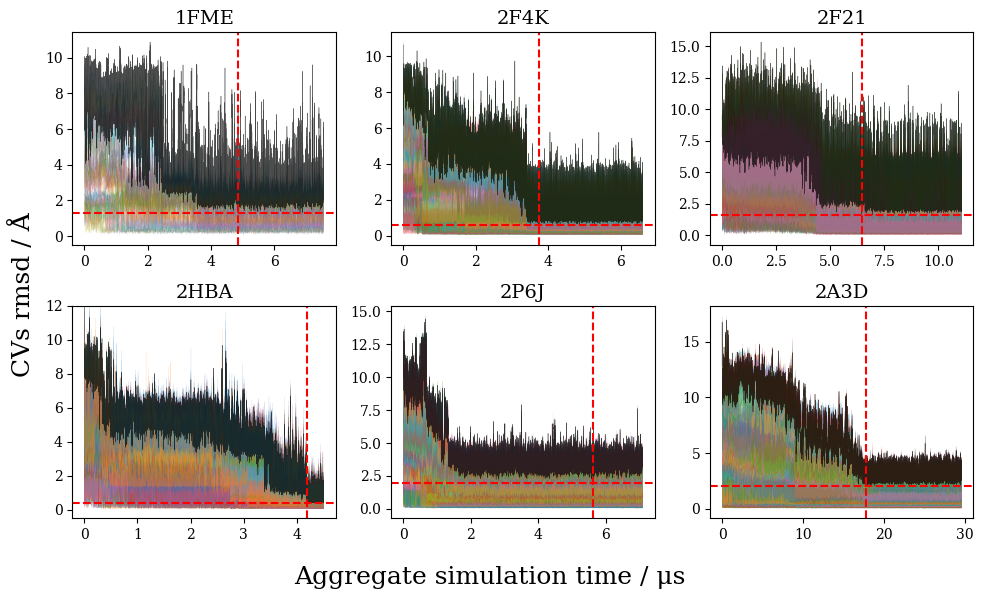

In [53]:
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "serif"
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
intervals = [400, 400, 400, 400, 400, 800]
dts = [0.000025, 0.000025, 0.000025, 0.000025, 0.000025, 0.00005]
replicas = [16, 16, 16, 16, 16, 16]
base_dir = './iTOL_plot/'

stride = 100

# Create a grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(10, 6))

for i,protein_name in enumerate(protein_lst):
    for rmsd in alpha_rmsd[i]:
        axs[i // 3, i % 3].plot((np.arange(len(rmsd))[::stride]*dts[i]), rmsd[::stride], linewidth=0.1, alpha=0.4)
    stride = 1
    rmsd = alpha_rmsd[i][whole_struc_ind[i][0]]
    axs[i // 3, i % 3].plot((np.arange(len(rmsd))[::stride]*dts[i]), rmsd[::stride], linewidth=0.3, color='k', alpha=0.7)
    axs[i // 3, i % 3].axhline(y=np.min(rmsd), color='red', linestyle='--')
    axs[i // 3, i % 3].axvline(x=folded_state_rmsd[i]*dts[i], color='red', linestyle='--')
    axs[i // 3, i % 3].set_title(protein_name.upper(), fontsize=14)
    print('minimum rmsd = ',np.min(rmsd))

axs[1, 0].set_ylim(-0.5, 12)

fig.supxlabel('Aggregate simulation time / μs', fontsize=18)
fig.supylabel('CVs rmsd / Å', fontsize=18)

# Adjust the spacing between subplots
plt.tight_layout()
    
# Show the plot
# plt.show()

plt.savefig('CVs_rmsd.jpg', dpi=500)
plt.savefig('CVs_rmsd.png', dpi=100)

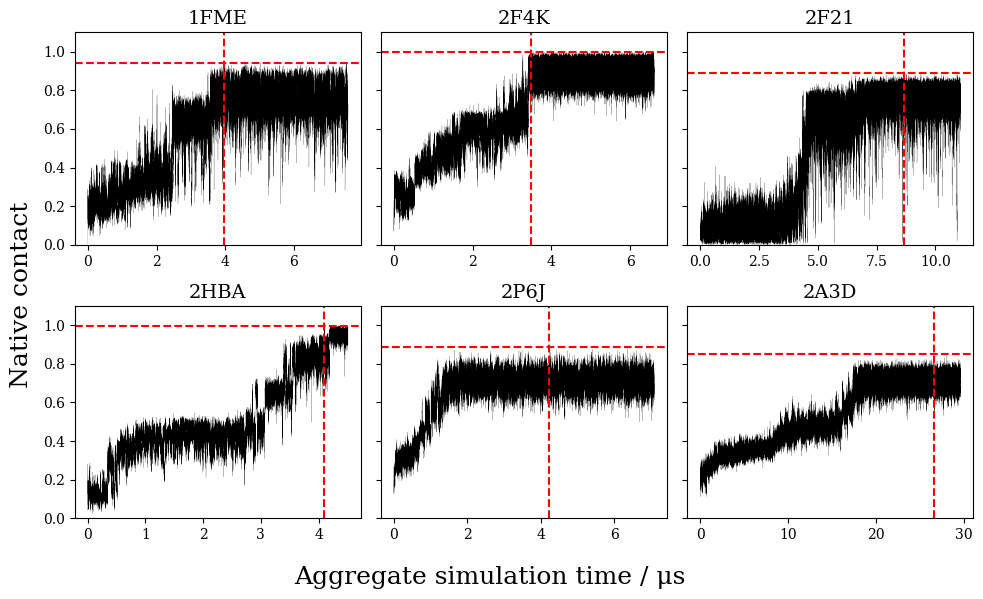

In [54]:
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
intervals = [400, 400, 400, 400, 400, 800]
replicas = [16, 16, 16, 16, 16, 16]
base_dir = './iTOL_plot/'

stride = 1

# Create a grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(10, 6), sharey=True)

for i,protein_name in enumerate(protein_lst):
    q = Q[i]
    axs[i // 3, i % 3].plot((np.arange(len(q))[::stride]*dts[i]), q[::stride], linewidth=0.1, color='k')
    # Set the y-axis range
    axs[i // 3, i % 3].set_ylim(0, 1.1)
    axs[i // 3, i % 3].axhline(y=np.max(q), color='red', linestyle='--')
    axs[i // 3, i % 3].axvline(x=folded_state_q[i]*dts[i], color='red', linestyle='--')
    axs[i // 3, i % 3].set_title(protein_name.upper(), fontsize=14)
    
fig.supxlabel('Aggregate simulation time / μs', fontsize=18)
fig.supylabel('Native contact', fontsize=18)

# Adjust the spacing between subplots
plt.tight_layout()


# Show the plot
# plt.show()

plt.savefig('CVs_q.jpg', dpi=500)
plt.savefig('CVs_q.png', dpi=100)

#### RL-disabled Adaptive CVgen 300K (α=0)

In [55]:
alpha_rmsd = []
Q = []
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
base_dir = './iTOL_plot/'
whole_struc_ind = []
for i,protein_name in enumerate(protein_lst):
    alpha_rmsd.append([])
    native_ref = md.load_pdb(base_dir+protein_name+'/p.pdb')
    n_resi = native_ref.topology.n_residues
    traj = md.load_dcd('./data/'+protein_name+'/No_delt/'+'history.dcd', top=base_dir+protein_name+'/p.pdb')
    cvgenerator_ts = CVgenerator(base_dir+protein_name+'/p.pdb',windows_size='auto',steps='auto',mode='regular')
    sel_indices, CV_residues_index = cvgenerator_ts.generateCV()
    for sel_indice in sel_indices:
        rmsd = md.rmsd(traj, native_ref, atom_indices=sel_indice)
        alpha_rmsd[i].append(rmsd*10)
    
    cv_len = np.array([len(CV) for CV in CV_residues_index])
    whole_struc_ind.append(np.where(cv_len==n_resi)[0])
    
    q = best_hummer_q(traj, native_ref)
    Q.append(q)

In [56]:
RL_disabled_folded_state_rmsd = []
RL_disabled_folded_state_q = []
RL_disabled_min_rmsd = []
RL_disabled_max_q = []
i = 0
for rmsd,q in zip(alpha_rmsd,Q):
    rcut = np.min(rmsd[whole_struc_ind[i][0]])+0.1
    qcut = np.max(q)-0.01
    RL_disabled_folded_state_rmsd.append(np.where(rmsd[whole_struc_ind[i][0]]<rcut)[0][0])
    RL_disabled_folded_state_q.append(np.where(q>qcut)[0][0])
    RL_disabled_min_rmsd.append(np.min(rmsd[whole_struc_ind[i][0]]))
    RL_disabled_max_q.append(np.max(q))
    i += 1

print(RL_disabled_folded_state_rmsd)
print(RL_disabled_folded_state_q)

[74477, 137150, 197841, 510561, 676188, 105149]
[79226, 131671, 162287, 414469, 585720, 720764]


minimum rmsd =  1.3543572
minimum rmsd =  0.6214148
minimum rmsd =  1.6278031
minimum rmsd =  4.9183073
minimum rmsd =  4.262056
minimum rmsd =  7.414649


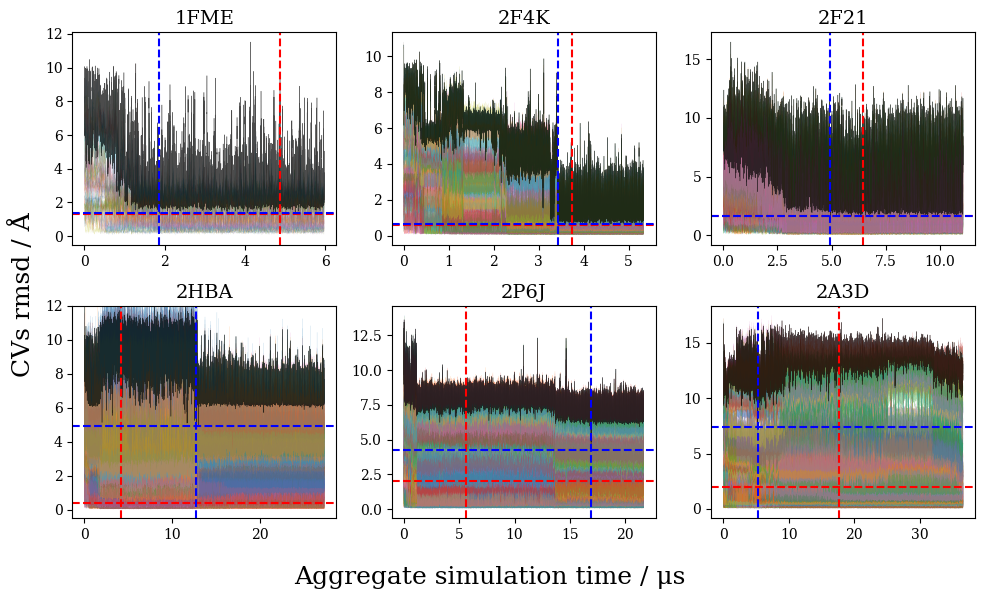

In [57]:
import matplotlib.pyplot as plt
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
intervals = [400, 400, 400, 400, 400, 800]
dts = [0.000025, 0.000025, 0.000025, 0.000025, 0.000025, 0.00005]
replicas = [16, 16, 16, 16, 16, 16]
base_dir = './iTOL_plot/'

stride = 100

# Create a grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(10, 6))

for i,protein_name in enumerate(protein_lst):
    for rmsd in alpha_rmsd[i]:
        axs[i // 3, i % 3].plot((np.arange(len(rmsd))[::stride]*dts[i]), rmsd[::stride], linewidth=0.1, alpha=0.4)
    
    stride = 1
    rmsd = alpha_rmsd[i][whole_struc_ind[i][0]]
    axs[i // 3, i % 3].plot((np.arange(len(rmsd))[::stride]*dts[i]), rmsd[::stride], linewidth=0.3, color='k', alpha=0.7)
    axs[i // 3, i % 3].axhline(y=min_rmsd[i], color='red', linestyle='--')
    axs[i // 3, i % 3].axvline(x=folded_state_rmsd[i]*dts[i], color='red', linestyle='--')
    axs[i // 3, i % 3].axhline(y=RL_disabled_min_rmsd[i], color='blue', linestyle='--')
    axs[i // 3, i % 3].axvline(x=RL_disabled_folded_state_rmsd[i]*dts[i], color='blue', linestyle='--')
    axs[i // 3, i % 3].set_title(protein_name.upper(), fontsize=14)
    print('minimum rmsd = ',np.min(rmsd))

axs[1, 0].set_ylim(-0.5, 12)

fig.supxlabel('Aggregate simulation time / μs', fontsize=18)
fig.supylabel('CVs rmsd / Å', fontsize=18)

# Adjust the spacing between subplots
plt.tight_layout()
    
# Show the plot
# plt.show()

plt.savefig('RL_disabled_CVs_rmsd.jpg', dpi=500)
plt.savefig('RL_disabled_CVs_rmsd.png', dpi=100)

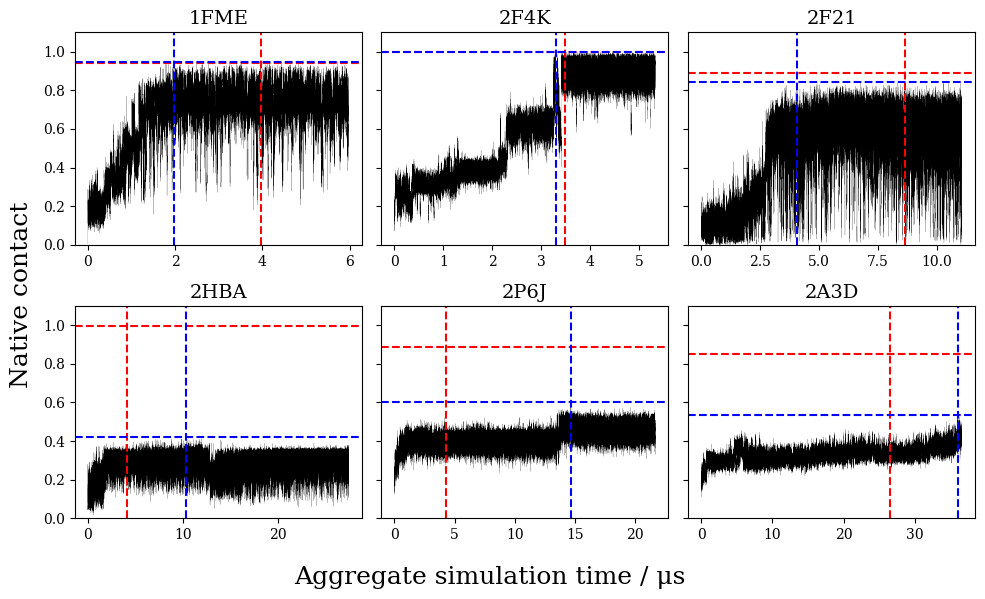

In [58]:
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
intervals = [400, 400, 400, 400, 400, 800]
replicas = [16, 16, 16, 16, 16, 16]
base_dir = './iTOL_plot/'

stride = 1

# Create a grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(10, 6), sharey=True)

for i,protein_name in enumerate(protein_lst):
    q = Q[i]
    axs[i // 3, i % 3].plot((np.arange(len(q))[::stride]*dts[i]), q[::stride], linewidth=0.1, color='k')
    # Set the y-axis range
    axs[i // 3, i % 3].set_ylim(0, 1.1)
    axs[i // 3, i % 3].axhline(y=max_q[i], color='red', linestyle='--')
    axs[i // 3, i % 3].axvline(x=folded_state_q[i]*dts[i], color='red', linestyle='--')
    axs[i // 3, i % 3].axhline(y=RL_disabled_max_q[i], color='blue', linestyle='--')
    axs[i // 3, i % 3].axvline(x=RL_disabled_folded_state_q[i]*dts[i], color='blue', linestyle='--')
    axs[i // 3, i % 3].set_title(protein_name.upper(), fontsize=14)
    
fig.supxlabel('Aggregate simulation time / μs', fontsize=18)
fig.supylabel('Native contact', fontsize=18)

# Adjust the spacing between subplots
plt.tight_layout()


# Show the plot
# plt.show()

plt.savefig('RL_disabled_CVs_q.jpg', dpi=500)
plt.savefig('RL_disabled_CVs_q.png', dpi=100)

#### RL-enhanced Adaptive CVgen 300K (α=0.1)

#### RL-enhanced Adaptive CVgen 300K (α=1)

#### Adaptive CVgen compare D.E.Shaw

In [59]:
T_setting = ['325K', '360K', '360K', '355K', '360K', '370K']
alpha_rmsd = []
Q = []
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
base_dir = './iTOL_plot/'
whole_struc_ind = []
for i,protein_name in enumerate(protein_lst):
    alpha_rmsd.append([])
    native_ref = md.load_pdb(base_dir+protein_name+'/p.pdb')
    n_resi = native_ref.topology.n_residues
    traj = md.load_dcd('./data/compare_DEshaw/'+protein_name+'/history.dcd', top=base_dir+protein_name+'/p.pdb')
    cvgenerator_ts = CVgenerator(base_dir+protein_name+'/p.pdb',windows_size='auto',steps='auto',mode='regular')
    sel_indices, CV_residues_index = cvgenerator_ts.generateCV()
    for sel_indice in sel_indices:
        rmsd = md.rmsd(traj, native_ref, atom_indices=sel_indice)
        alpha_rmsd[i].append(rmsd*10)
    
    cv_len = np.array([len(CV) for CV in CV_residues_index])
    whole_struc_ind.append(np.where(cv_len==n_resi)[0])
    
    q = best_hummer_q(traj, native_ref)
    Q.append(q)

In [60]:
compared_folded_state_rmsd = []
compared_folded_state_q = []
compared_min_rmsd = []
compared_max_q = []
i = 0
for rmsd,q in zip(alpha_rmsd,Q):
    rcut = np.min(rmsd[whole_struc_ind[i][0]])+0.1
    qcut = np.max(q)-0.01
    compared_folded_state_rmsd.append(np.where(rmsd[whole_struc_ind[i][0]]<rcut)[0][0])
    compared_folded_state_q.append(np.where(q>qcut)[0][0])
    compared_min_rmsd.append(np.min(rmsd[whole_struc_ind[i][0]]))
    compared_max_q.append(np.max(q))
    i += 1

print(compared_folded_state_rmsd)
print(compared_folded_state_q)

[124181, 59602, 242000, 47825, 255225, 66400]
[192471, 46869, 132374, 47968, 123607, 483483]


minimum rmsd =  1.3934373
minimum rmsd =  0.6721297
minimum rmsd =  1.6420859
minimum rmsd =  0.37934434
minimum rmsd =  1.6752837
minimum rmsd =  2.0547512


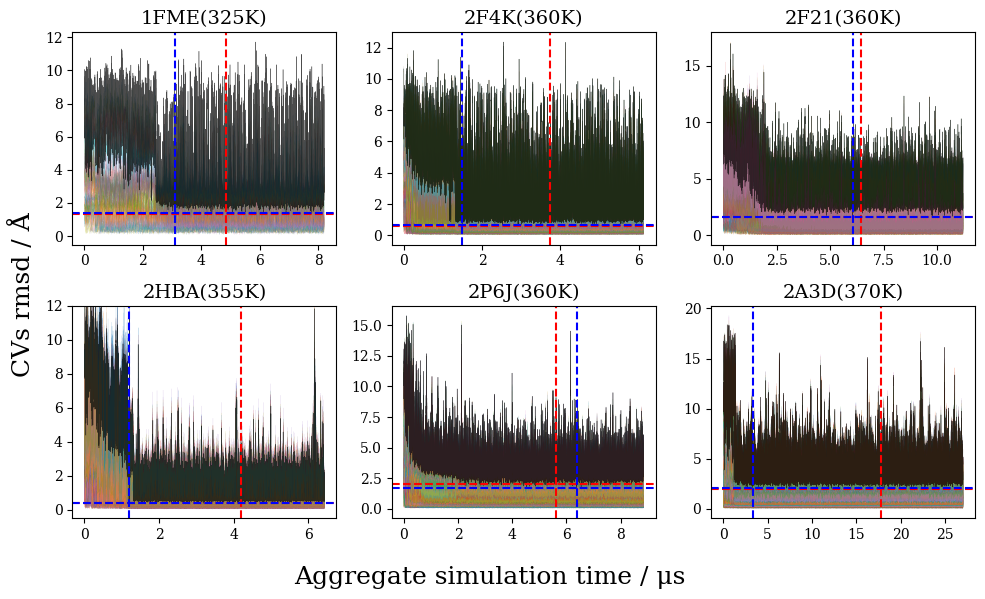

In [61]:
import matplotlib.pyplot as plt
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
intervals = [400, 400, 400, 400, 400, 800]
replicas = [16, 16, 16, 16, 16, 16]
base_dir = './iTOL_plot/'

stride = 100

# Create a grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(10, 6))

for i,protein_name in enumerate(protein_lst):
    for rmsd in alpha_rmsd[i]:
        axs[i // 3, i % 3].plot((np.arange(len(rmsd))[::stride]*dts[i]), rmsd[::stride], linewidth=0.1, alpha=0.4)
    stride = 1
    rmsd = alpha_rmsd[i][whole_struc_ind[i][0]]
    axs[i // 3, i % 3].plot((np.arange(len(rmsd))[::stride]*dts[i]), rmsd[::stride], linewidth=0.3, color='k', alpha=0.7)
    axs[i // 3, i % 3].axhline(y=min_rmsd[i], color='red', linestyle='--')
    axs[i // 3, i % 3].axvline(x=folded_state_rmsd[i]*dts[i], color='red', linestyle='--')
    axs[i // 3, i % 3].axhline(y=compared_min_rmsd[i], color='blue', linestyle='--')
    axs[i // 3, i % 3].axvline(x=compared_folded_state_rmsd[i]*dts[i], color='blue', linestyle='--')
    axs[i // 3, i % 3].set_title(protein_name.upper()+'('+T_setting[i]+')', fontsize=14)
    print('minimum rmsd = ',np.min(rmsd))

axs[1, 0].set_ylim(-0.5, 12)

fig.supxlabel('Aggregate simulation time / μs', fontsize=18)
fig.supylabel('CVs rmsd / Å', fontsize=18)

# Adjust the spacing between subplots
plt.tight_layout()
    
# Show the plot
# plt.show()

plt.savefig('compared_CVs_rmsd.jpg', dpi=500)
plt.savefig('compared_CVs_rmsd.png', dpi=100)

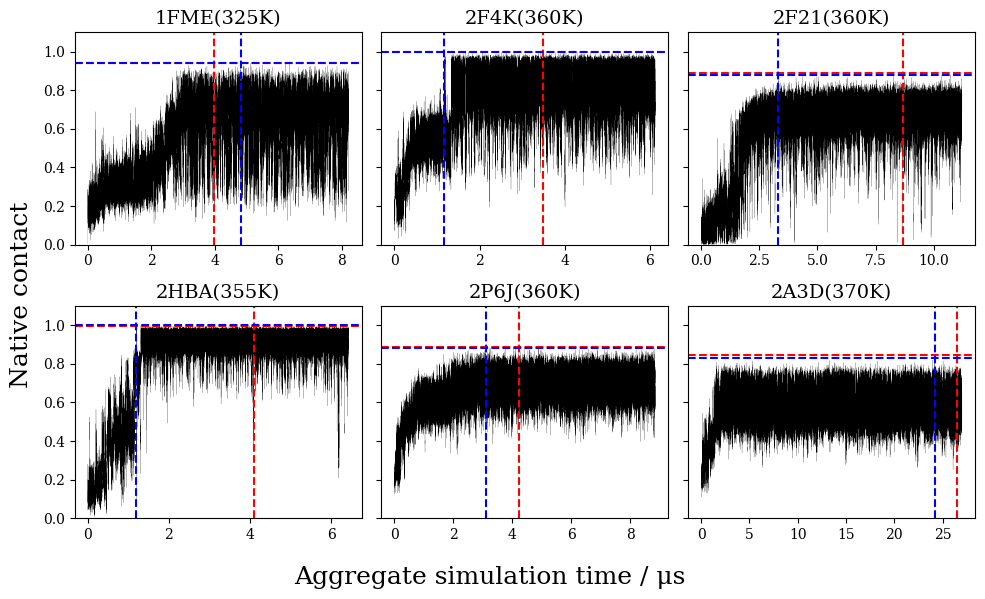

In [62]:
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
intervals = [400, 400, 400, 400, 400, 800]
replicas = [16, 16, 16, 16, 16, 16]
base_dir = './iTOL_plot/'

stride = 1

# Create a grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(10, 6), sharey=True)

for i,protein_name in enumerate(protein_lst):
    q = Q[i]
    axs[i // 3, i % 3].plot((np.arange(len(q))[::stride]*dts[i]), q[::stride], linewidth=0.1, color='k')
    # Set the y-axis range
    axs[i // 3, i % 3].set_ylim(0, 1.1)
    axs[i // 3, i % 3].axhline(y=max_q[i], color='red', linestyle='--')
    axs[i // 3, i % 3].axvline(x=folded_state_q[i]*dts[i], color='red', linestyle='--')
    axs[i // 3, i % 3].axhline(y=compared_max_q[i], color='blue', linestyle='--')
    axs[i // 3, i % 3].axvline(x=compared_folded_state_q[i]*dts[i], color='blue', linestyle='--')
    axs[i // 3, i % 3].set_title(protein_name.upper()+'('+T_setting[i]+')', fontsize=14)
    
fig.supxlabel('Aggregate simulation time / μs', fontsize=18)
fig.supylabel('Native contact', fontsize=18)

# Adjust the spacing between subplots
plt.tight_layout()


# Show the plot
# plt.show()

plt.savefig('compared_CVs_q.jpg', dpi=500)
plt.savefig('compared_CVs_q.png', dpi=100)

#### Rerun 10-times of 2F4K system

In [63]:
dirs = ['./data/2f4k/2f4k.dcd','./data/2f4k/reruns/rerun1/history.dcd','./data/2f4k/reruns/rerun2/history.dcd'
        ,'./data/2f4k/reruns/rerun3/history.dcd','./data/2f4k/reruns/rerun4/history.dcd','./data/2f4k/reruns/rerun5/history.dcd'
        ,'./data/2f4k/reruns/rerun6/history.dcd','./data/2f4k/reruns/rerun7/history.dcd','./data/2f4k/reruns/rerun8/history.dcd'
        ,'./data/2f4k/reruns/rerun9/history.dcd']

In [64]:
from tqdm import tqdm
trajs = []
for file in tqdm(dirs):
    trajs.append(md.load_dcd(file,top='./data/2f4k/reruns/rerun1/p.pdb'))

100%|██████████| 10/10 [03:37<00:00, 21.74s/it]


In [65]:
native_ref = md.load_pdb('./data/2f4k/reruns/rerun1/p.pdb')
alpha = native_ref.topology.select_atom_indices('alpha')
rmsds = []
Q = []
stride = 10
for traj in trajs:
    rmsds.append(md.rmsd(traj, native_ref, atom_indices=alpha)*10)
    Q.append(best_hummer_q(traj, native_ref))

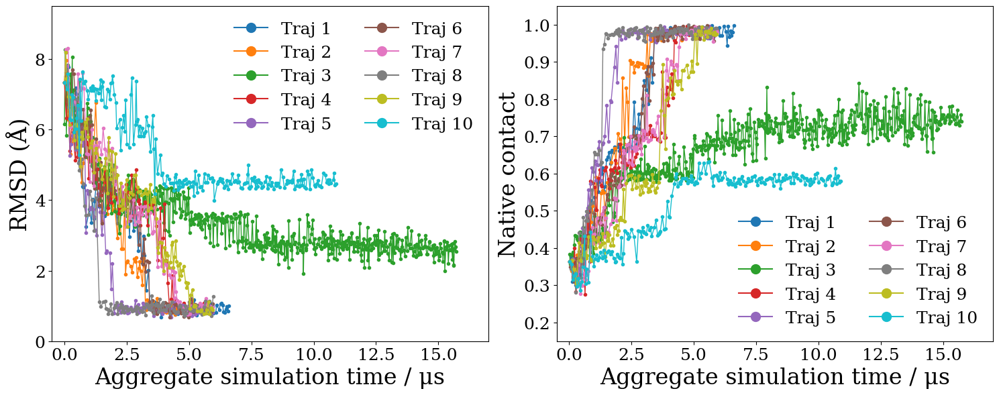

In [66]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from scipy.signal import argrelextrema
plt.rcParams["font.family"] = "serif"

# Create a grid of subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))
handles = []  # 用于存储代理艺术家
for i, rmsd in enumerate(rmsds):
    if i == 2:
        stride = 10
        order = 50
    else:
        stride = 100
        order = 10
    x_rmsd = np.arange(len(rmsd))[::stride]*dts[0]
    x_q = np.arange(len(Q[i]))[::stride]*dts[0]
    # axs[0].plot(x_rmsd, rmsd[::stride], linestyle='-', linewidth=0.1, alpha=0.6)
    # axs[1].plot(x_q, Q[i][::stride], linestyle='-', linewidth=0.1, alpha=0.6)

    # 找到局部极小值点
    minima_indices = argrelextrema(rmsd[::stride], np.less, order=order)[0]
    minima_x = x_rmsd[minima_indices]
    minima_y = rmsd[::stride][minima_indices]
    # axs[0].plot(minima_x, minima_y, marker='o', linestyle='-', label=f'Traj {i+1}', markersize=3, linewidth=1)
    line, = axs[0].plot(minima_x, minima_y, marker='o', linestyle='-', label=f'Traj {i+1}', markersize=3, linewidth=1)

    
    # 找到局部极大值点
    maxima_indices = argrelextrema(Q[i][::stride], np.greater, order=order)[0]
    maxima_x = x_q[maxima_indices]
    maxima_y = Q[i][::stride][maxima_indices]
    axs[1].plot(maxima_x, maxima_y, marker='o', linestyle='-', label=f'Traj {i+1}', markersize=3, linewidth=1)

    # 创建代理艺术家
    marker = mlines.Line2D([], [], color=line.get_color(), marker='o', linestyle='-', markersize=10, label=f'Traj {i+1}')
    handles.append(marker)

axs[0].legend(handles=handles, loc='upper right', framealpha=0.0, fontsize=18, ncol=2)
axs[1].legend(handles=handles, loc='lower right', framealpha=0.0, fontsize=18, ncol=2)
# axs[0].legend(loc='upper right', framealpha=0.0, fontsize=18, ncol=2)
# axs[1].legend(loc='lower right', framealpha=0.0, fontsize=18, ncol=2)

axs[0].set_xlabel('Aggregate simulation time / μs', fontsize=24)
axs[1].set_xlabel('Aggregate simulation time / μs', fontsize=24)
axs[0].set_ylabel('RMSD (Å)', fontsize=24)
axs[1].set_ylabel('Native contact', fontsize=24)
axs[0].set_xlim(-0.5, 17)
axs[0].set_ylim(0, 9.5)
axs[1].set_xlim(-0.5, 17)
axs[1].set_ylim(0.15, 1.05)
axs[0].tick_params(axis='both', labelsize=18)
axs[1].tick_params(axis='both', labelsize=18)

# Adjust the spacing between subplots
plt.tight_layout()

# plt.show()

plt.savefig('rerun_2f4k.jpg', dpi=500)
plt.savefig('rerun_2f4k.png', dpi=100)

## TICA plot
### the difference between whether there is $delt$ in the Adaptive CVgen method

In [2]:
import os
import pickle
import numpy as np
import mdtraj as md
import pyemma
from deeptime.clustering import KMeans
from deeptime.decomposition import TICA
from deeptime.markov.tools import estimation
import alphashape
from shapely.geometry import Polygon
from scipy.interpolate import CubicSpline

In [3]:
def smooth_polygon_vertices(vertices, smoothness=100):
    if not np.array_equal(vertices[0], vertices[-1]):
        vertices = np.vstack([vertices, vertices[0]])
    dists = np.sqrt(np.sum(np.diff(vertices, axis=0)**2, axis=1))
    dists = np.insert(dists, 0, 0)
    cum_dists = np.cumsum(dists)
    cum_dists /= cum_dists[-1]
    cs_x = CubicSpline(cum_dists, vertices[:, 0], bc_type='periodic')
    cs_y = CubicSpline(cum_dists, vertices[:, 1], bc_type='periodic')
    smooth_dists = np.linspace(0, 1, smoothness)
    return np.vstack([cs_x(smooth_dists), cs_y(smooth_dists)]).T

def plot_cluster_shape(data, alpha_val):
    alpha_shape = alphashape.alphashape(data, alpha_val)
    if isinstance(alpha_shape, Polygon):
        polygon_points = np.array(alpha_shape.exterior.coords)
    else:
        polygon_points = np.array(list(alpha_shape.geoms)[0].exterior.coords)
    smooth_points = smooth_polygon_vertices(polygon_points, smoothness=200)
    return smooth_points

def feature(dirs, pdb):
    feat = pyemma.coordinates.featurizer(pdb)
    pairs = feat.pairs(feat.select_Ca())
    feat.add_contacts(pairs,threshold=0.8)
    data = pyemma.coordinates.source(dirs, features=feat)
    data_output = data.get_output()
    return data_output

def cluster(feature,n_clusters=400):
    from sklearn.cluster import MiniBatchKMeans
    kmeans = MiniBatchKMeans(n_clusters=n_clusters,random_state=0,batch_size=2048,n_init="auto",max_iter=200)
    first_dim = feature.shape[0]
    trans_data = feature.reshape(first_dim,-1)
    kmeans = kmeans.partial_fit(trans_data)
    cluster_labels = kmeans.labels_
    return cluster_labels

In [3]:
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
intervals = [400, 400, 400, 400, 400, 800]
replicas = [16, 16, 16, 16, 16, 16]
lagtimes = [40, 40, 40, 40, 40, 80]

In [5]:
# load native states dirs
native_pdbs = []
native_dcds = []
for i,protein_name in enumerate(protein_lst):
    native_pdbs.append('./iTOL_plot/'+protein_name+'/p.pdb')
    native_dcds.append('./iTOL_plot/'+protein_name+'/p.dcd')
    native_pdb = md.load_pdb(native_pdbs[i])
    native_pdb.save('./iTOL_plot/'+protein_name+'/p.dcd')
    
native_outs = []
for pdb,dcd in zip(native_pdbs,native_dcds):
    native_outs.append(feature(dcd,pdb))

In [30]:
AC_RL_lens = []
AC_noRL_lens = []
all_tics = []

for i,protein_name in enumerate(protein_lst):
    with open('./data/'+protein_name+'/data_output.pkl', 'rb') as f:
        AC_data = pickle.load(f)
    with open('./data/'+protein_name+'/No_delt/data_output.pkl', 'rb') as f:
        LC_data = pickle.load(f)
    tica_estimator = TICA(lagtime=lagtimes[i], dim=2)
    AC = np.concatenate(np.array(AC_data),axis=0)
    LC = np.concatenate(np.array(LC_data),axis=0)
    
    del AC_data, LC_data
    
    all_out = np.concatenate((AC,LC),axis=0)
    all_out = np.concatenate((all_out,native_outs[i][0]),axis=0)
    tica = tica_estimator.fit(all_out).fetch_model()
    print('TICA dimension = ', tica.output_dimension)
    tics = tica.transform(all_out)
    all_tics.append(tics)
    
    AC_RL_lens.append(AC.shape[0])
    AC_noRL_lens.append(LC.shape[0])
    
    del AC, LC, all_out, tics

TICA dimension =  2
TICA dimension =  2
TICA dimension =  2
TICA dimension =  2
TICA dimension =  2
TICA dimension =  2


In [ ]:
smooth_points = []
for i, pro in enumerate(protein_lst):
    A = plot_cluster_shape(all_tics[i][:AC_RL_lens[i]],2)
    B = plot_cluster_shape(all_tics[i][AC_RL_lens[i]:-1],2)
    smooth_points.append([A,B])

In [ ]:
new_array = np.delete(all_tics[0][AC_RL_lens[0]:-1], np.where((all_tics[0][AC_RL_lens[0]:-1][:,0]>-2)&(all_tics[0][AC_RL_lens[0]:-1][:,1]<-2)),axis=0)

In [ ]:
A = plot_cluster_shape(all_tics[0][:AC_RL_lens[0]],2)
B = plot_cluster_shape(new_array,2)
smooth_points[0] = [A,B]

In [31]:
with open('AC_RL_lens.pkl', 'wb') as f:
    pickle.dump(AC_RL_lens, f)
with open('AC_noRL_lens.pkl', 'wb') as f:
    pickle.dump(AC_noRL_lens, f)
with open('all_tics.pkl', 'wb') as f:
    pickle.dump(all_tics, f)
with open('smooth_points.pkl', 'wb') as f:
    pickle.dump(smooth_points, f)

In [6]:
with open('AC_RL_lens.pkl', 'rb') as f:
    AC_RL_lens = pickle.load(f)
with open('AC_noRL_lens.pkl', 'rb') as f:
    AC_noRL_lens = pickle.load(f)
with open('all_tics.pkl', 'rb') as f:
    all_tics = pickle.load(f)
with open('smooth_points.pkl', 'rb') as f:
    smooth_points = pickle.load(f)

In [4]:
dir = './data/'

WP = []
delt = []
W = []
epsilon_WP = []
epsilon_DELT = []
epsilon_W = []
epsilon_WDELT = []
T_values = []
for i,protein_name in enumerate(protein_lst):
    log_file = dir + protein_name + '/'+protein_name + '.log'
    # Extract values from the file
    WP.append(extract_values(log_file, 'theta'))
    delt.append(extract_values(log_file, 'delt'))
    W.append(extract_values(log_file, 'W'))

    T = len(W[-1])
    T_values.append(range(1, T))
    # Calculate epsilon values
    epsilon_wp = []
    tmp = 0
    for j in range(WP[-1].shape[0] - 1):
        tmp += np.sum(np.abs(WP[-1][j+1] - WP[-1][j]))
        epsilon_wp.append(tmp)
    epsilon_WP.append(np.array(epsilon_wp))

    epsilon_delt = []
    tmp = 0
    for j in range(delt[-1].shape[0] - 1):
        tmp += np.sum(np.abs(delt[-1][j+1] - delt[-1][j]))
        epsilon_delt.append(tmp)
    epsilon_DELT.append(np.array(epsilon_delt))

    epsilon_w = []
    tmp = 0
    for j in range(W[-1].shape[0] - 1):
        tmp += np.sum(np.abs(W[-1][j+1] - W[-1][j]))
        epsilon_w.append(tmp)
    epsilon_W.append(np.array(epsilon_w))

    epsilon_wdelt = []
    tmp = 0
    for j in range(1, W[-1].shape[0]):
        tmp += np.sum(np.abs(W[-1][j] - WP[-1][j]))
        epsilon_wdelt.append(tmp)
    epsilon_WDELT.append(np.array(epsilon_wdelt))

In [8]:
letter_size = 30
label_size = 28
lengend_size = 20
marker_size = 24

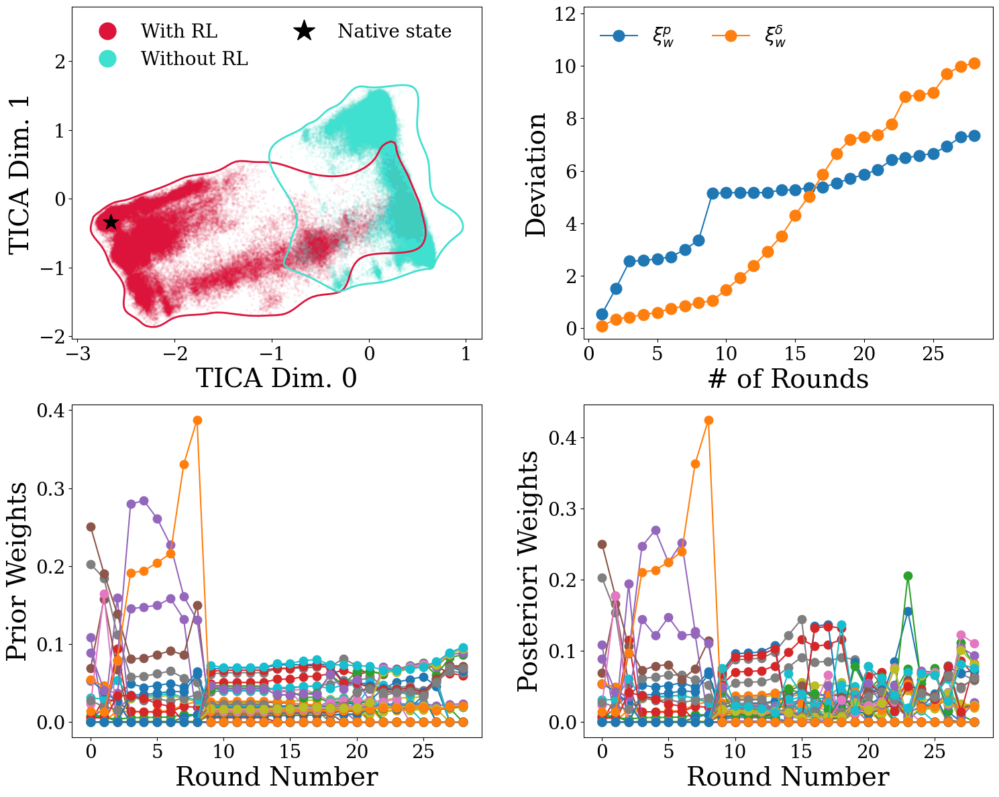

In [14]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
# Set the global font to be Times New Roman, size 10 (or any other size you want)
plt.rcParams["font.family"] = "serif"

for th_num_pro in [3]:
    # Create a grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(15, 12))

    # # Add labels to each subplot
    # axs[0, 0].text(-0.18, 1.03, "(a)", transform=axs[0, 0].transAxes, fontsize=letter_size, fontweight='bold')
    # axs[0, 1].text(-0.18, 1.03, "(b)", transform=axs[0, 1].transAxes, fontsize=letter_size, fontweight='bold')
    # axs[1, 0].text(-0.18, 1.03, "(c)", transform=axs[1, 0].transAxes, fontsize=letter_size, fontweight='bold')
    # axs[1, 1].text(-0.18, 1.03, "(d)", transform=axs[1, 1].transAxes, fontsize=letter_size, fontweight='bold')

    axs[0,0].scatter(all_tics[th_num_pro][:AC_RL_lens[th_num_pro],0], all_tics[th_num_pro][:AC_RL_lens[th_num_pro],1], label=r'With $delta$', c='Crimson', s=5, alpha=0.05)
    # 绘制平滑的轮廓线
    axs[0,0].plot(smooth_points[th_num_pro][0][:, 0], smooth_points[th_num_pro][0][:, 1], color='Crimson', linewidth=2)

    axs[0,0].scatter(all_tics[th_num_pro][AC_RL_lens[th_num_pro]:-1,0], all_tics[th_num_pro][AC_RL_lens[th_num_pro]:-1,1], label=r'Without $delta$', c='Turquoise', s=5, alpha=0.05)
    # 绘制平滑的轮廓线
    axs[0,0].plot(smooth_points[th_num_pro][1][:, 0], smooth_points[th_num_pro][1][:, 1], color='Turquoise', linewidth=2)

    # 绘制天然态点
    axs[0,0].scatter(all_tics[th_num_pro][-1,0], all_tics[th_num_pro][-1,1], label='Native state', c='black', s=300, marker='*')
    axs[0, 0].set_xlabel('TICA Dim. 0', fontsize=label_size)
    axs[0, 0].set_ylabel('TICA Dim. 1', fontsize=label_size)


    # Plot the variables in the corresponding subplot
    axs[0,1].plot(T_values[th_num_pro], epsilon_WP[th_num_pro], label=r'$\xi$$^p_w$', marker='.', markersize=marker_size)
    # axs[0,1].plot(T_values[th_num_pro], epsilon_W[th_num_pro], label=r'$\xi$$_w$', marker='.', markersize=marker_size)
    axs[0,1].plot(T_values[th_num_pro], epsilon_WDELT[th_num_pro], label=r'$\xi$$^\delta_w$', marker='.', markersize=marker_size)
    # axs[0,1].plot(T_values[th_num_pro], epsilon_DELT[th_num_pro], label=r'$\xi$$_\delta$', marker='.', markersize=marker_size)
    # axs[0,1].axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')

    axs[0, 1].set_xlabel('# of Rounds', fontsize=label_size)
    axs[0, 1].set_ylabel('Deviation', fontsize=label_size)

    for j in range(len(WP[th_num_pro][0])):
        axs[1,0].plot(range(len(WP[th_num_pro])), WP[th_num_pro][:,j], marker='.', markersize=marker_size-6)
    # axs[1,0].axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')
    axs[1, 0].set_xlabel('Round Number', fontsize=label_size)
    axs[1, 0].set_ylabel('Prior Weights', fontsize=label_size)

    for j in range(len(W[th_num_pro][0])):
        axs[1,1].plot(range(len(W[th_num_pro])), W[th_num_pro][:,j], marker='.', markersize=marker_size-6)
    # axs[1,1].axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')
    axs[1, 1].set_xlabel('Round Number', fontsize=label_size)
    axs[1, 1].set_ylabel('Posteriori Weights', fontsize=label_size)

    # 调整每个子图的纵坐标范围以免图例遮盖数据点
    ylims = axs[0,0].get_ylim()
    new_ylims = (ylims[0], ylims[1] + (ylims[1] - ylims[0]) * 0.25)  # 在原有基础上增加15%的空间
    axs[0,0].set_ylim(new_ylims)
    ylims = axs[0,1].get_ylim()
    new_ylims = (ylims[0], ylims[1] + (ylims[1] - ylims[0]) * 0.15)  # 在原有基础上增加15%的空间
    axs[0,1].set_ylim(new_ylims)

    # # 创建图例
    # legend = axs[i // 3, i % 3].legend(loc='upper left', framealpha=0.3)
    # # 放大图例的marker尺寸
    # for handle in legend.legendHandles:
    #     handle.set_sizes([30])  # 调整图例marker的尺寸
    # 创建自定义图例
    legend_cvgen = mlines.Line2D([], [], color='Crimson', marker='o', linestyle='None', markersize=18, label=r'With $delta$', alpha=1.0)
    legend_Anton = mlines.Line2D([], [], color='Turquoise', marker='o', linestyle='None', markersize=18, label=r'Without $delta$', alpha=1.0)
    legend_native = mlines.Line2D([], [], color='black', marker='*', linestyle='None', markersize=marker_size, label='Native state', alpha=1.0)
    axs[0,0].legend(handles=[legend_cvgen, legend_Anton, legend_native], loc='upper left', framealpha=0.0, fontsize=lengend_size, ncol=2)

    axs[0,1].legend()
    axs[0,1].legend(loc='upper left', framealpha=0.0, fontsize=lengend_size, ncol=2)
    # 设置刻度值的大小
    axs[0,0].tick_params(axis='both', labelsize=20)
    axs[0,1].tick_params(axis='both', labelsize=20)
    axs[1,0].tick_params(axis='both', labelsize=20)
    axs[1,1].tick_params(axis='both', labelsize=20)
            
    # Adjust the spacing between subplots
    plt.tight_layout()

    # Show the plot
    # plt.show()

    plt.savefig('RL_'+protein_lst[th_num_pro].upper()+'.jpg', dpi=500)

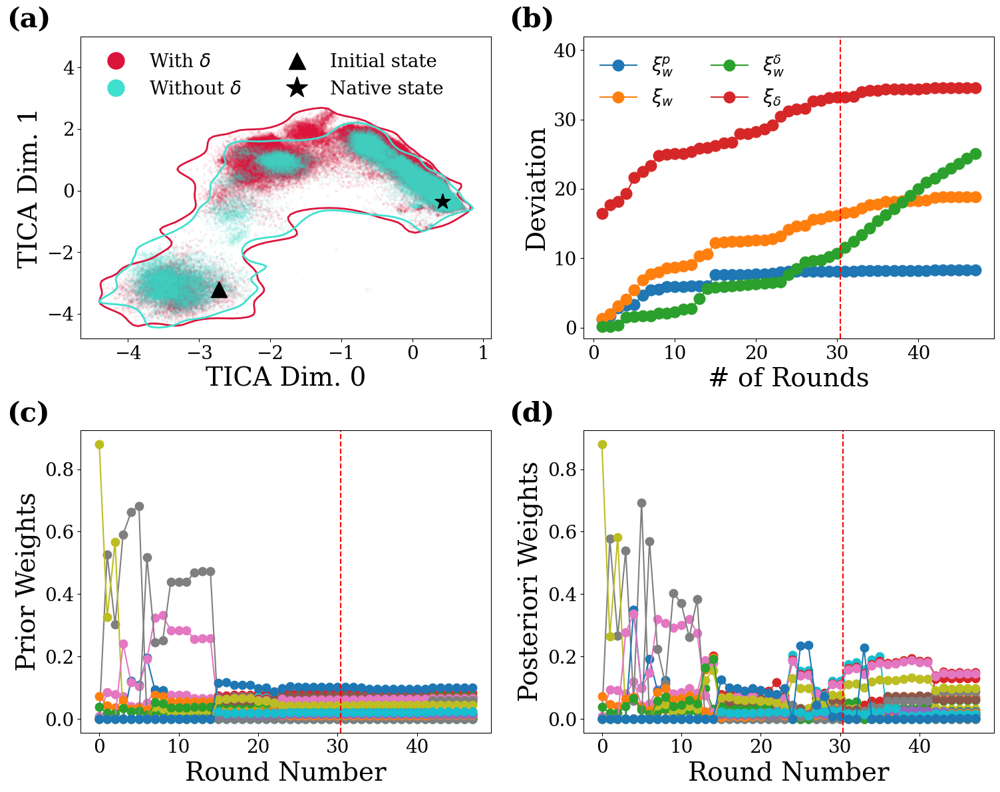

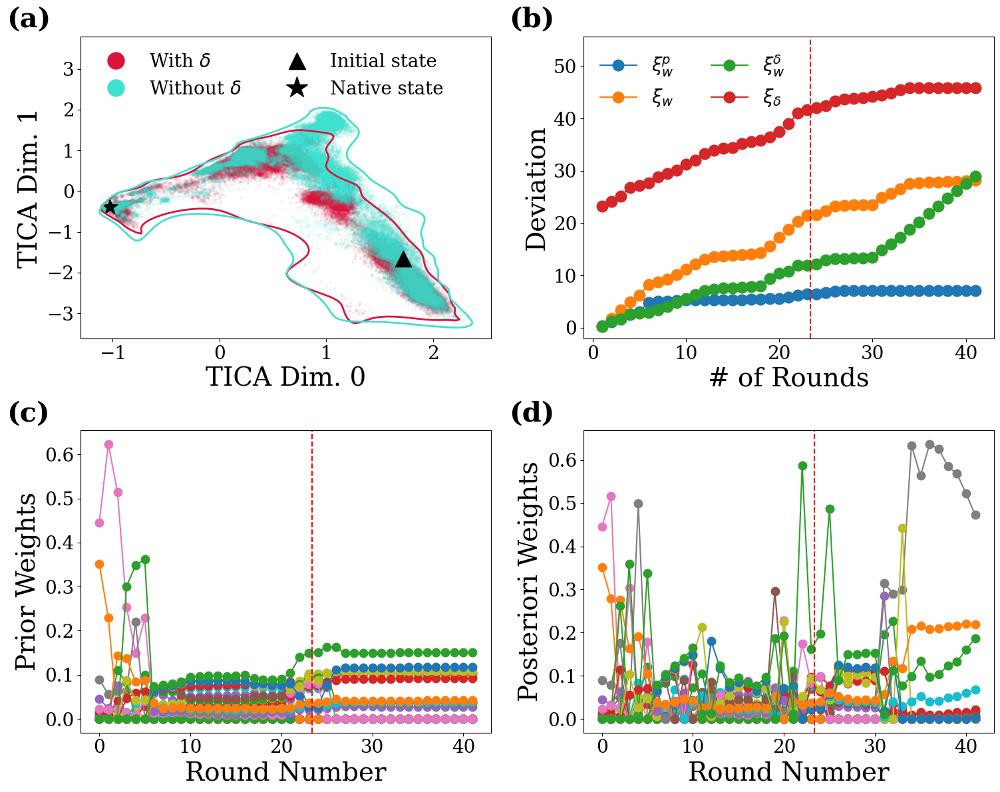

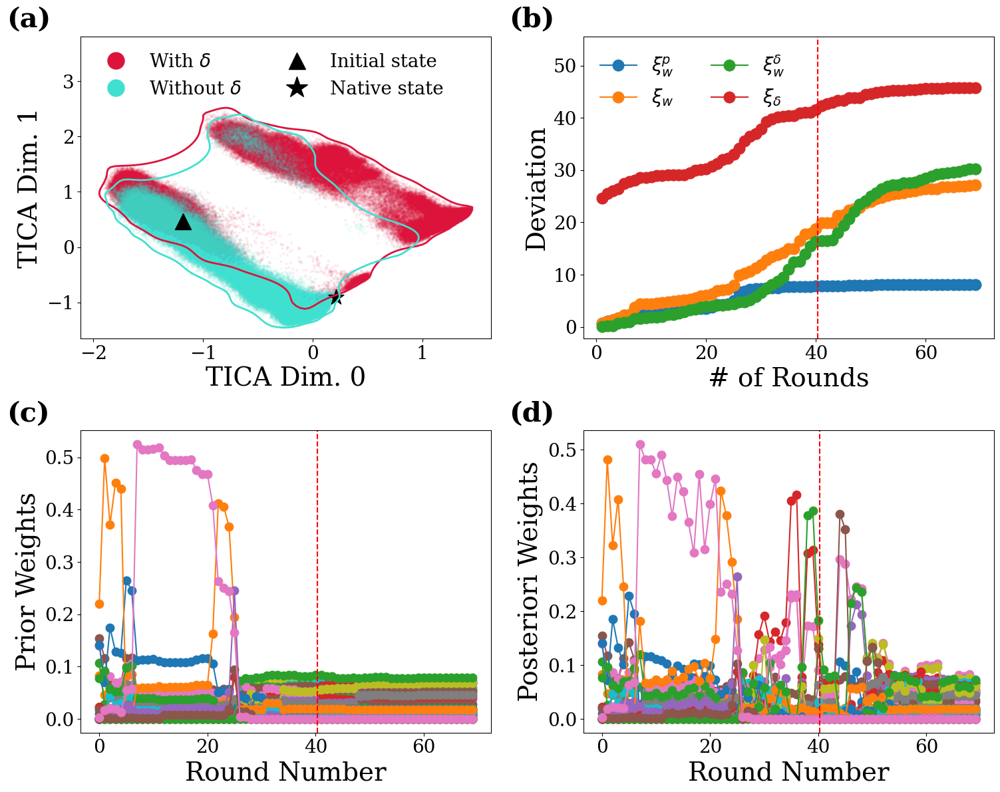

In [13]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
# Set the global font to be Times New Roman, size 10 (or any other size you want)
plt.rcParams["font.family"] = "serif"

for th_num_pro in range(3):
    # Create a grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(15, 12))

    # Add labels to each subplot
    axs[0, 0].text(-0.18, 1.03, "(a)", transform=axs[0, 0].transAxes, fontsize=letter_size, fontweight='bold')
    axs[0, 1].text(-0.18, 1.03, "(b)", transform=axs[0, 1].transAxes, fontsize=letter_size, fontweight='bold')
    axs[1, 0].text(-0.18, 1.03, "(c)", transform=axs[1, 0].transAxes, fontsize=letter_size, fontweight='bold')
    axs[1, 1].text(-0.18, 1.03, "(d)", transform=axs[1, 1].transAxes, fontsize=letter_size, fontweight='bold')

    axs[0,0].scatter(all_tics[th_num_pro][:AC_RL_lens[th_num_pro],0], all_tics[th_num_pro][:AC_RL_lens[th_num_pro],1], label=r'With $\delta$', c='Crimson', s=5, alpha=0.05)
    # 绘制平滑的轮廓线
    axs[0,0].plot(smooth_points[th_num_pro][0][:, 0], smooth_points[th_num_pro][0][:, 1], color='Crimson', linewidth=2)

    axs[0,0].scatter(all_tics[th_num_pro][AC_RL_lens[th_num_pro]:-1,0], all_tics[th_num_pro][AC_RL_lens[th_num_pro]:-1,1], label=r'Without $\delta$', c='Turquoise', s=5, alpha=0.05)
    # 绘制平滑的轮廓线
    axs[0,0].plot(smooth_points[th_num_pro][1][:, 0], smooth_points[th_num_pro][1][:, 1], color='Turquoise', linewidth=2)

    #绘制初始构象点
    axs[0,0].scatter(all_tics[th_num_pro][0,0], all_tics[th_num_pro][0,1], label='Initial state', c='black', s=300, marker='^')
    # 绘制天然态点
    axs[0,0].scatter(all_tics[th_num_pro][-1,0], all_tics[th_num_pro][-1,1], label='Native state', c='black', s=300, marker='*')
    axs[0, 0].set_xlabel('TICA Dim. 0', fontsize=label_size)
    axs[0, 0].set_ylabel('TICA Dim. 1', fontsize=label_size)


    # Plot the variables in the corresponding subplot
    axs[0,1].plot(T_values[th_num_pro], epsilon_WP[th_num_pro], label=r'$\xi$$^p_w$', marker='.', markersize=marker_size)
    axs[0,1].plot(T_values[th_num_pro], epsilon_W[th_num_pro], label=r'$\xi$$_w$', marker='.', markersize=marker_size)
    axs[0,1].plot(T_values[th_num_pro], epsilon_WDELT[th_num_pro], label=r'$\xi$$^\delta_w$', marker='.', markersize=marker_size)
    axs[0,1].plot(T_values[th_num_pro], epsilon_DELT[th_num_pro], label=r'$\xi$$_\delta$', marker='.', markersize=marker_size)
    axs[0,1].axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')

    axs[0, 1].set_xlabel('# of Rounds', fontsize=label_size)
    axs[0, 1].set_ylabel('Deviation', fontsize=label_size)

    for j in range(len(WP[th_num_pro][0])):
        axs[1,0].plot(range(len(WP[th_num_pro])), WP[th_num_pro][:,j], marker='.', markersize=marker_size-6)
    axs[1,0].axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')
    axs[1, 0].set_xlabel('Round Number', fontsize=label_size)
    axs[1, 0].set_ylabel('Prior Weights', fontsize=label_size)

    for j in range(len(W[th_num_pro][0])):
        axs[1,1].plot(range(len(W[th_num_pro])), W[th_num_pro][:,j], marker='.', markersize=marker_size-6)
    axs[1,1].axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')
    axs[1, 1].set_xlabel('Round Number', fontsize=label_size)
    axs[1, 1].set_ylabel('Posteriori Weights', fontsize=label_size)

    # 调整每个子图的纵坐标范围以免图例遮盖数据点
    ylims = axs[0,0].get_ylim()
    new_ylims = (ylims[0], ylims[1] + (ylims[1] - ylims[0]) * 0.25)  # 在原有基础上增加15%的空间
    axs[0,0].set_ylim(new_ylims)
    ylims = axs[0,1].get_ylim()
    new_ylims = (ylims[0], ylims[1] + (ylims[1] - ylims[0]) * 0.15)  # 在原有基础上增加15%的空间
    axs[0,1].set_ylim(new_ylims)

    # # 创建图例
    # legend = axs[i // 3, i % 3].legend(loc='upper left', framealpha=0.3)
    # # 放大图例的marker尺寸
    # for handle in legend.legendHandles:
    #     handle.set_sizes([30])  # 调整图例marker的尺寸
    # 创建自定义图例
    legend_cvgen = mlines.Line2D([], [], color='Crimson', marker='o', linestyle='None', markersize=18, label=r'With $\delta$', alpha=1.0)
    legend_Anton = mlines.Line2D([], [], color='Turquoise', marker='o', linestyle='None', markersize=18, label=r'Without $\delta$', alpha=1.0)
    legend_initial = mlines.Line2D([], [], color='black', marker='^', linestyle='None', markersize=18, label='Initial state', alpha=1.0)
    legend_native = mlines.Line2D([], [], color='black', marker='*', linestyle='None', markersize=marker_size, label='Native state', alpha=1.0)
    axs[0,0].legend(handles=[legend_cvgen, legend_Anton, legend_initial, legend_native], loc='upper left', framealpha=0.0, fontsize=lengend_size, ncol=2)

    axs[0,1].legend()
    axs[0,1].legend(loc='upper left', framealpha=0.0, fontsize=lengend_size, ncol=2)
    # 设置刻度值的大小
    axs[0,0].tick_params(axis='both', labelsize=20)
    axs[0,1].tick_params(axis='both', labelsize=20)
    axs[1,0].tick_params(axis='both', labelsize=20)
    axs[1,1].tick_params(axis='both', labelsize=20)
            
    # Adjust the spacing between subplots
    plt.tight_layout()

    # Show the plot
    # plt.show()

    plt.savefig('RL_'+protein_lst[th_num_pro].upper()+'.jpg', dpi=500)
    plt.savefig('RL_'+protein_lst[th_num_pro].upper()+'.png', dpi=100)

In [14]:
upper_lim = [(25, 48),(37, 68),(55, 84)]
lower_lim = [(-2, 16.5),(-2, 18),(-2, 22)]

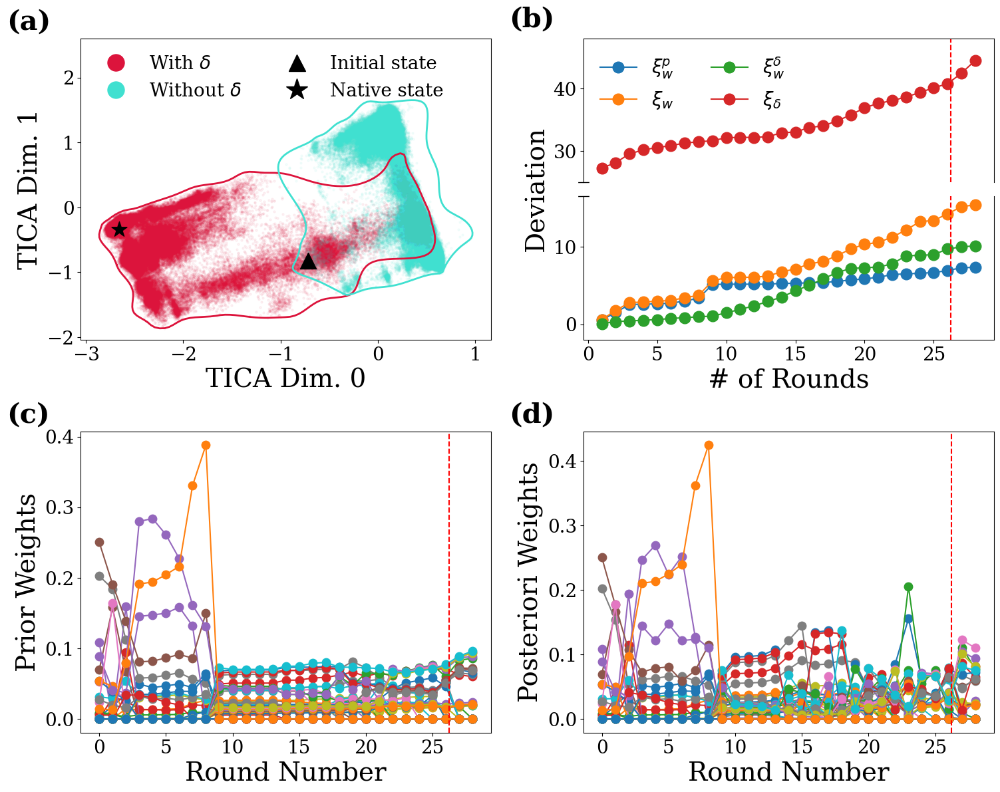

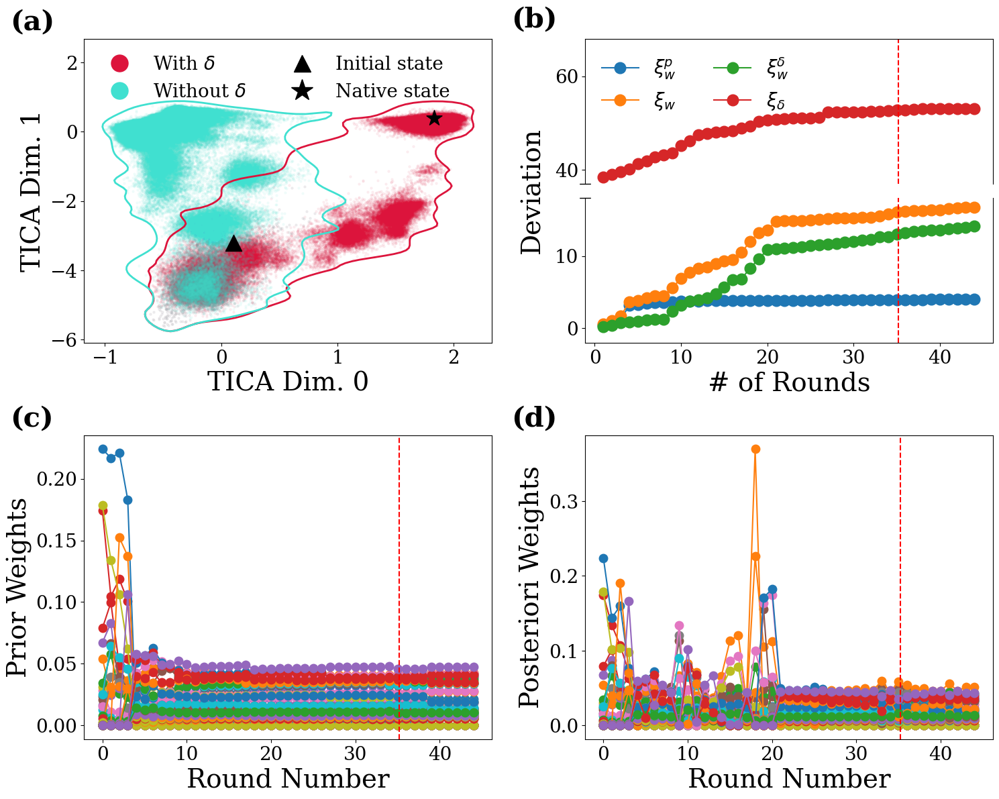

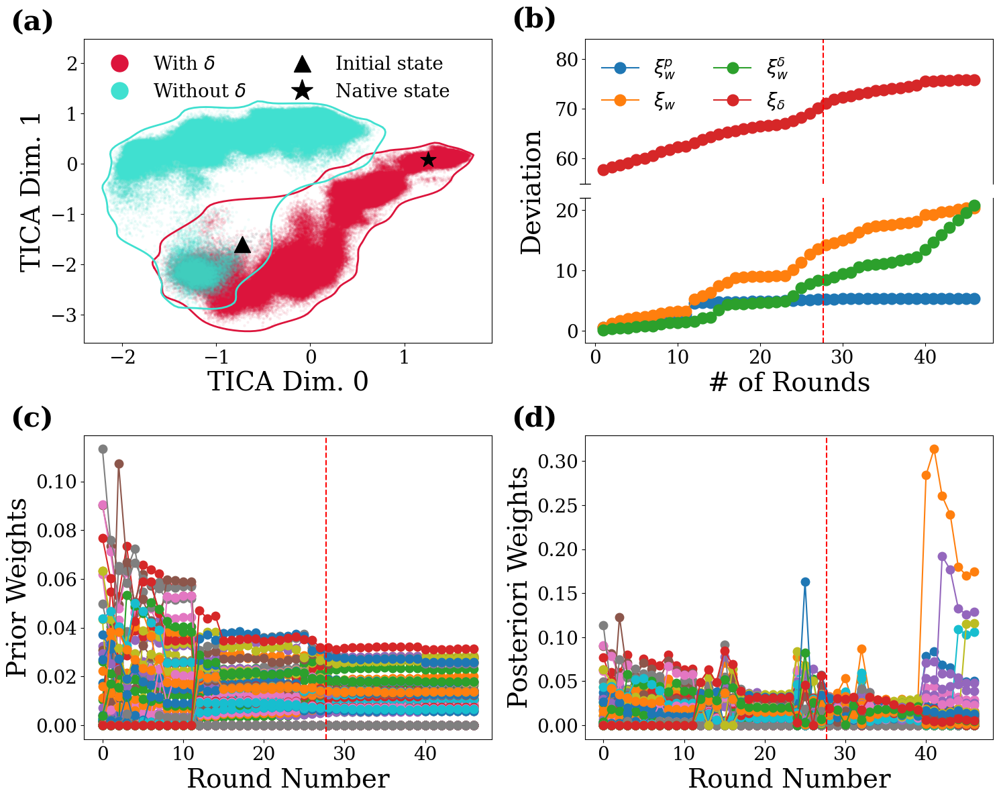

In [15]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.lines as mlines
plt.rcParams["font.family"] = "serif"
for th in range(3):
    th_num_pro = 3
    th_num_pro += th

    # 使用 GridSpec 创建布局
    fig = plt.figure(figsize=(15, 12))
    gs = gridspec.GridSpec(2, 2, figure=fig)

    # 为（0,0）子图和其它未变更的子图创建 Axes
    ax0 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[1, 0])
    ax3 = fig.add_subplot(gs[1, 1])

    # 处理（0,0）子图
    ax0.scatter(all_tics[th_num_pro][:AC_RL_lens[th_num_pro],0], all_tics[th_num_pro][:AC_RL_lens[th_num_pro],1], label=r'With $\delta$', c='Crimson', s=5, alpha=0.05)
    ax0.plot(smooth_points[th_num_pro][0][:, 0], smooth_points[th_num_pro][0][:, 1], color='Crimson', linewidth=2)
    ax0.scatter(all_tics[th_num_pro][AC_RL_lens[th_num_pro]:-1,0], all_tics[th_num_pro][AC_RL_lens[th_num_pro]:-1,1], label=r'Without $\delta$', c='Turquoise', s=5, alpha=0.05)
    ax0.plot(smooth_points[th_num_pro][1][:, 0], smooth_points[th_num_pro][1][:, 1], color='Turquoise', linewidth=2)
    #绘制初始构象点
    ax0.scatter(all_tics[th_num_pro][0,0], all_tics[th_num_pro][0,1], label='Initial state', c='black', s=300, marker='^')
    ax0.scatter(all_tics[th_num_pro][-1,0], all_tics[th_num_pro][-1,1], label='Native state', c='black', s=300, marker='*')
    ax0.set_xlabel('TICA Dim. 0', fontsize=label_size)
    ax0.set_ylabel('TICA Dim. 1', fontsize=label_size)

    # 使用 GridSpec 创建（0,1）子图的断裂显示
    gs01 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[0, 1], hspace=0.1)
    ax_upper = fig.add_subplot(gs01[0])
    ax_lower = fig.add_subplot(gs01[1])

    # 在上半部分绘制大于50的数据
    ax_upper.plot(T_values[th_num_pro], epsilon_WP[th_num_pro], label=r'$\xi$$^p_w$', marker='.', markersize=marker_size)
    ax_upper.plot(T_values[th_num_pro], epsilon_W[th_num_pro], label=r'$\xi$$_w$', marker='.', markersize=marker_size)
    ax_upper.plot(T_values[th_num_pro], epsilon_WDELT[th_num_pro], label=r'$\xi$$^\delta_w$', marker='.', markersize=marker_size)
    ax_upper.plot(T_values[th_num_pro], epsilon_DELT[th_num_pro], label=r'$\xi$$_\delta$', marker='.', markersize=marker_size)
    ax_upper.axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')
    ax_upper.set_ylim(upper_lim[th][0], upper_lim[th][1])  # 假定的上界
    ax_upper.spines['bottom'].set_visible(False)
    ax_upper.xaxis.tick_top()
    ax_upper.tick_params(labeltop=False)  # 隐藏上部的x轴标签
    ax_upper.tick_params(axis='both', which='both', bottom=False, top=False, left=True, right=False, labelbottom=False, labelleft=True)


    # 添加断裂标记
    d = .005  # 斜线的长度
    kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
                linestyle="none", color='k', mec='k', mew=1, clip_on=False)
    ax_upper.plot([0.0], [0], transform=ax_upper.transAxes, **kwargs)
    ax_lower.plot([0.0], [1], transform=ax_lower.transAxes, **kwargs)

    # 在下半部分绘制小于30的数据
    ax_lower.plot(T_values[th_num_pro], epsilon_WP[th_num_pro], marker='.', markersize=marker_size)
    ax_lower.plot(T_values[th_num_pro], epsilon_W[th_num_pro], marker='.', markersize=marker_size)
    ax_lower.plot(T_values[th_num_pro], epsilon_WDELT[th_num_pro], marker='.', markersize=marker_size)
    ax_lower.plot(T_values[th_num_pro], epsilon_DELT[th_num_pro], marker='.', markersize=marker_size)
    ax_lower.axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')
    ax_lower.set_ylim(lower_lim[th][0], lower_lim[th][1])  # 假定的下界
    ax_lower.spines['top'].set_visible(False)

    # 设置共用的横纵坐标名称
    ax_lower.set_xlabel('# of Rounds', fontsize=label_size)  # 设置下方子图的横坐标名称
    fig.text(0.52, 0.76, 'Deviation', va='center', rotation='vertical', fontsize=label_size)  # 在图表左侧设置共用的纵坐标名称

    # 设置共用的图例
    lines, labels = ax_upper.get_legend_handles_labels()
    ax_upper.legend(lines, labels, loc='upper left', framealpha=0.0, fontsize=lengend_size, ncol=2)

    # 处理其它子图
    for j in range(len(WP[th_num_pro][0])):
        ax2.plot(range(len(WP[th_num_pro])), WP[th_num_pro][:,j], marker='.', markersize=marker_size-6)
    ax2.axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')
    ax2.set_xlabel('Round Number', fontsize=label_size)
    ax2.set_ylabel('Prior Weights', fontsize=label_size)

    for j in range(len(W[th_num_pro][0])):
        ax3.plot(range(len(W[th_num_pro])), W[th_num_pro][:,j], marker='.', markersize=marker_size-6)
    ax3.axvline(x=folded_state_rmsd[th_num_pro]/(intervals[th_num_pro]*replicas[th_num_pro]), color='red', linestyle='--')
    ax3.set_xlabel('Round Number', fontsize=label_size)
    ax3.set_ylabel('Posteriori Weights', fontsize=label_size)

    # 调整子图的纵坐标范围以避免图例遮挡数据点
    ylims = ax0.get_ylim()
    new_ylims = (ylims[0], ylims[1] + (ylims[1] - ylims[0]) * 0.20)  # 在原有基础上增加15%的空间
    ax0.set_ylim(new_ylims)

    # 创建自定义图例
    legend_cvgen = mlines.Line2D([], [], color='Crimson', marker='o', linestyle='None', markersize=18, label=r'With $\delta$', alpha=1.0)
    legend_Anton = mlines.Line2D([], [], color='Turquoise', marker='o', linestyle='None', markersize=18, label=r'Without $\delta$', alpha=1.0)
    legend_initial = mlines.Line2D([], [], color='black', marker='^', linestyle='None', markersize=18, label='Initial state', alpha=1.0)
    legend_native = mlines.Line2D([], [], color='black', marker='*', linestyle='None', markersize=24, label='Native state', alpha=1.0)
    ax0.legend(handles=[legend_cvgen, legend_Anton, legend_initial, legend_native], loc='upper left', framealpha=0.0, fontsize=lengend_size, ncol=2)

    # Add labels to each subplot
    loc = [-0.18, 1.03]
    ax0.text(loc[0], loc[1], "(a)", transform=ax0.transAxes, fontsize=letter_size, fontweight='bold')
    ax_upper.text(loc[0], loc[1]+0.05, "(b)", transform=ax_upper.transAxes, fontsize=letter_size, fontweight='bold')
    ax2.text(loc[0], loc[1], "(c)", transform=ax2.transAxes, fontsize=letter_size, fontweight='bold')
    ax3.text(loc[0], loc[1], "(d)", transform=ax3.transAxes, fontsize=letter_size, fontweight='bold')
    
    # 设置刻度值的大小
    ax0.tick_params(axis='both', labelsize=20)
    ax_upper.tick_params(axis='both', labelsize=20)
    ax_lower.tick_params(axis='both', labelsize=20)
    ax2.tick_params(axis='both', labelsize=20)
    ax3.tick_params(axis='both', labelsize=20)

    # 调整子图间距
    plt.tight_layout()

    # 显示图表
    # plt.show()

    plt.savefig('RL_'+protein_lst[th_num_pro].upper()+'.jpg', dpi=500)
    plt.savefig('RL_'+protein_lst[th_num_pro].upper()+'.png', dpi=100)

## mechanisum of α

In [4]:
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
intervals = [400, 400, 400, 400, 400, 800]
replicas = [16, 16, 16, 16, 16, 16]
lagtimes = [40, 40, 40, 40, 40, 80]
# load native states dirs
native_pdbs = []
native_dcds = []
for i,protein_name in enumerate(protein_lst):
    native_pdbs.append('./iTOL_plot/'+protein_name+'/p.pdb')
    native_dcds.append('./iTOL_plot/'+protein_name+'/p.dcd')
    native_pdb = md.load_pdb(native_pdbs[i])
    native_pdb.save('./iTOL_plot/'+protein_name+'/p.dcd')
    
native_outs = []
for pdb,dcd in zip(native_pdbs,native_dcds):
    native_outs.append(feature(dcd,pdb))

AC_lens = []
AC0_lens = []
AC01_lens = []
AC1_lens = []
all_alpha_tics = []

for i,protein_name in enumerate(protein_lst):
    with open('./data/'+protein_name+'/data_output.pkl', 'rb') as f:
        AC_data = pickle.load(f)
    with open('./data/'+protein_name+'/alpha0/data_output.pkl', 'rb') as f:
        AC0_data = pickle.load(f)
    with open('./data/'+protein_name+'/alpha0.1/data_output.pkl', 'rb') as f:
        AC01_data = pickle.load(f)
    with open('./data/'+protein_name+'/alpha1/data_output.pkl', 'rb') as f:
        AC1_data = pickle.load(f)
    tica_estimator = TICA(lagtime=lagtimes[i], dim=2)
    AC = np.concatenate(np.array(AC_data),axis=0)
    del AC_data
    AC0 = np.concatenate(np.array(AC0_data),axis=0)
    del AC0_data
    AC01 = np.concatenate(np.array(AC01_data),axis=0)
    del AC01_data
    AC1 = np.concatenate(np.array(AC1_data),axis=0)
    del AC1_data
    
    AC_lens.append(AC.shape[0])
    AC0_lens.append(AC_lens[-1]+AC0.shape[0])
    AC01_lens.append(AC0_lens[-1]+AC01.shape[0])
    AC1_lens.append(AC01_lens[-1]+AC1.shape[0])
    
    all_out = np.concatenate((AC,AC0,AC01,AC1),axis=0)
    del AC, AC0, AC01, AC1
    all_out = np.concatenate((all_out,native_outs[i][0]),axis=0)
    if i == 5:
        tica = tica_estimator.fit(all_out[::2]).fetch_model()
    elif i == 2:
        tica = tica_estimator.fit(all_out).fetch_model()
    else:
        tica = tica_estimator.fit(all_out[::10]).fetch_model()
    print('TICA dimension = ', tica.output_dimension)
    tics = tica.transform(all_out)
    all_alpha_tics.append(tics)
    
    del all_out, tics

TICA dimension =  2
TICA dimension =  2
TICA dimension =  2
TICA dimension =  2
TICA dimension =  2
TICA dimension =  2


In [5]:
alpha_smooth_points = []
for i, pro in enumerate(protein_lst):
    A = plot_cluster_shape(all_alpha_tics[i][:AC_lens[i]],2)
    B = plot_cluster_shape(all_alpha_tics[i][AC_lens[i]:AC0_lens[i]],2)
    C = plot_cluster_shape(all_alpha_tics[i][AC0_lens[i]:AC01_lens[i]],2)
    D = plot_cluster_shape(all_alpha_tics[i][AC01_lens[i]:-1],2)
    alpha_smooth_points.append([A,B,C,D])

new_array = np.delete(all_alpha_tics[0][AC_lens[0]:AC0_lens[0]], np.where((all_alpha_tics[0][AC_lens[0]:AC0_lens[0]][:,0]>-2)&(all_alpha_tics[0][AC_lens[0]:AC0_lens[0]][:,1]<-2)),axis=0)
modif = plot_cluster_shape(new_array,2)
alpha_smooth_points[0][1] = modif

In [6]:
with open('AC_lens.pkl', 'wb') as f:
    pickle.dump(AC_lens, f)
with open('AC0_lens.pkl', 'wb') as f:
    pickle.dump(AC0_lens, f)
with open('AC01_lens.pkl', 'wb') as f:
    pickle.dump(AC01_lens, f)
with open('AC1_lens.pkl', 'wb') as f:
    pickle.dump(AC1_lens, f)
with open('all_alpha_tics.pkl', 'wb') as f:
    pickle.dump(all_alpha_tics, f)
with open('alpha_smooth_points.pkl', 'wb') as f:
    pickle.dump(alpha_smooth_points, f)

In [4]:
with open('AC_lens.pkl', 'rb') as f:
    AC_lens = pickle.load(f)
with open('AC0_lens.pkl', 'rb') as f:
    AC0_lens = pickle.load(f)
with open('AC01_lens.pkl', 'rb') as f:
    AC01_lens = pickle.load(f)
with open('AC1_lens.pkl', 'rb') as f:
    AC1_lens = pickle.load(f)
with open('all_alpha_tics.pkl', 'rb') as f:
    all_alpha_tics = pickle.load(f)
with open('alpha_smooth_points.pkl', 'rb') as f:
    alpha_smooth_points = pickle.load(f)

In [7]:
import os
dir = './data/'
protein_lst = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
intervals = [400, 400, 400, 400, 400, 800]
replicas = [16, 16, 16, 16, 16, 16]
dts = [0.000025, 0.000025, 0.000025, 0.000025, 0.000025, 0.00005]

def calculate_epsilon(CV_gen_rmsd, intervals, i, n_replicas, init_trajs_len, W, EPSILON):
    indices = np.arange(0, len(CV_gen_rmsd[0]), intervals[i]*n_replicas)
    indices += init_trajs_len
    indices = indices[:len(W)]
    
    delt_theta = []
    for n, index in enumerate(indices):
        if n == 0:
            theta_t1 = 1/np.max(np.array(CV_gen_rmsd)[:,:index], axis=1)
            theta_t2 = 1/np.min(np.array(CV_gen_rmsd)[:,:index], axis=1)
            delt_theta.append(np.abs(theta_t2 - theta_t1))
        else:
            theta_t1 = 1/np.min(np.array(CV_gen_rmsd)[:,:indices[n-1]], axis=1)
            theta_t2 = 1/np.min(np.array(CV_gen_rmsd)[:,:index], axis=1)
            delt_theta.append(np.abs(theta_t2 - theta_t1))
    # delt_theta = np.array(delt_theta).T
    # epsilon = np.dot(W[i], delt_theta)
    epsilon = np.sum(np.array(delt_theta), axis=1)
    epsilon[0] = 0
    EPSILON.append(epsilon)

Initial_trajs_length = []
for i,protein_name in enumerate(protein_lst):
    traj = md.load_dcd(dir + protein_name + '/INIT_OUT/traj/replica0/0.dcd', top=dir + protein_name + '/alpha0/p.pdb')
    traj0 = md.load_dcd(dir + protein_name + '/alpha0/INIT_OUT/traj/replica0/0.dcd', top=dir + protein_name + '/alpha0/p.pdb')
    traj01 = md.load_dcd(dir + protein_name + '/alpha0.1/INIT_OUT/traj/replica0/0.dcd', top=dir + protein_name + '/alpha0/p.pdb')
    traj1 = md.load_dcd(dir + protein_name + '/alpha1/INIT_OUT/traj/replica0/0.dcd', top=dir + protein_name + '/alpha0/p.pdb')
    Initial_trajs_length.append([len(traj), len(traj0), len(traj01), len(traj1)])

W = []
W0 = []
W01 = []
W1 = []

EPSILON = []
EPSILON0 = []
EPSILON01 = []
EPSILON1 = []

time_per_round = []

for i,protein_name in enumerate(protein_lst):
    print('processing ', protein_name)
    log_file = dir + protein_name + '/'+ protein_name + '.log'
    log_file0 = dir + protein_name + '/alpha0/'+ protein_name + '.log'
    log_file01 = dir + protein_name + '/alpha0.1/'+ protein_name + '.log'
    log_file1 = dir + protein_name + '/alpha1/'+ protein_name + '.log'
    # Extract values from the file
    W.append(extract_values(log_file, 'W'))
    W0.append(extract_values(log_file0, 'W'))
    W01.append(extract_values(log_file01, 'W'))
    W1.append(extract_values(log_file1, 'W'))
    
    with open(dir + protein_name + '/CV_gen_rmsd.pkl', 'rb') as f:
        CV_gen_rmsd = pickle.load(f)
    with open(dir + protein_name + '/alpha0/CV_gen_rmsd.pkl', 'rb') as f:
        CV_gen_rmsd0 = pickle.load(f)
    with open(dir + protein_name + '/alpha0.1/CV_gen_rmsd.pkl', 'rb') as f:
        CV_gen_rmsd01 = pickle.load(f)
    with open(dir + protein_name + '/alpha1/CV_gen_rmsd.pkl', 'rb') as f:
        CV_gen_rmsd1 = pickle.load(f)
    
    init_trajs_len = Initial_trajs_length[i]
    n_replicas = len(os.listdir(dir + protein_name + '/pdbs/round0/'))
    n_replicas0 = len(os.listdir(dir + protein_name + '/alpha0/pdbs/round0/'))
    n_replicas01 = len(os.listdir(dir + protein_name + '/alpha0.1/pdbs/round0/'))
    n_replicas1 = len(os.listdir(dir + protein_name + '/alpha1/pdbs/round0/'))
    
    time = np.arange(0, len(CV_gen_rmsd[0]), intervals[i]*n_replicas)
    time += init_trajs_len[0]
    time = time*dts[i]
    time = time[:len(W[-1])]
    time0 = np.arange(0, len(CV_gen_rmsd0[0]), intervals[i]*n_replicas0)
    time0 += init_trajs_len[1]
    time0 = time0*dts[i]
    time0 = time0[:len(W0[-1])]
    time01 = np.arange(0, len(CV_gen_rmsd01[0]), intervals[i]*n_replicas01)
    time01 += init_trajs_len[2]
    time01 = time01*dts[i]
    time01 = time01[:len(W01[-1])]
    time1 = np.arange(0, len(CV_gen_rmsd1[0]), intervals[i]*n_replicas1)
    time1 += init_trajs_len[3]
    time1 = time1*dts[i]
    time1 = time1[:len(W1[-1])]
    time_per_round.append([time, time0, time01, time1])

    # compute epsilon
    calculate_epsilon(CV_gen_rmsd, intervals, i, n_replicas, init_trajs_len[0], W[-1], EPSILON)
    calculate_epsilon(CV_gen_rmsd0, intervals, i, n_replicas0, init_trajs_len[1], W0[-1], EPSILON0)
    calculate_epsilon(CV_gen_rmsd01, intervals, i, n_replicas01, init_trajs_len[2], W01[-1], EPSILON01)
    calculate_epsilon(CV_gen_rmsd1, intervals, i, n_replicas1, init_trajs_len[3], W1[-1], EPSILON1)

processing  1fme
processing  2f4k
processing  2f21
processing  2hba
processing  2p6j
processing  2a3d


In [8]:
def compute_rmsd(dir, protein_name, alpha, RMSD, dt, stride=10):
    ref = md.load_pdb(dir + protein_name + '/alpha0/p.pdb')
    alpha_indices = ref.topology.select_atom_indices('alpha')
    if alpha == '':
        file_path = dir + protein_name + '/' + protein_name + '.dcd'
    else:
        file_path = dir + protein_name + '/alpha' + alpha + '/' + protein_name + '.dcd'
    traj = md.load_dcd(file_path, top=dir + protein_name + '/alpha0/p.pdb')
    # print(traj)
    rmsd = md.rmsd(traj, ref, atom_indices=alpha_indices)
    print('rmsd.shape=',rmsd.shape)
    x = np.arange(len(rmsd))[::stride]*dt
    RMSD.append([x,rmsd[::stride]])
    del traj
    
RMSD = []
RMSD0 = []
RMSD01 = []
RMSD1 = []
dir = './data/'

for i,protein_name in enumerate(protein_lst):
    print('processing ', protein_name)
    
    #compute RMSD
    compute_rmsd(dir, protein_name, '', RMSD, dts[i], stride=100)
    compute_rmsd(dir, protein_name, '0', RMSD0, dts[i], stride=100)
    compute_rmsd(dir, protein_name, '0.1', RMSD01, dts[i], stride=100)
    compute_rmsd(dir, protein_name, '1', RMSD1, dts[i], stride=100)

processing  1fme
rmsd.shape= (302800,)
rmsd.shape= (238800,)
rmsd.shape= (245200,)
rmsd.shape= (812000,)
processing  2f4k
rmsd.shape= (264400,)
rmsd.shape= (213200,)
rmsd.shape= (842000,)
rmsd.shape= (464000,)
processing  2f21
rmsd.shape= (442400,)
rmsd.shape= (442400,)
rmsd.shape= (858400,)
rmsd.shape= (948800,)
processing  2hba
rmsd.shape= (180400,)
rmsd.shape= (1095600,)
rmsd.shape= (487200,)
rmsd.shape= (565200,)
processing  2p6j
rmsd.shape= (283600,)
rmsd.shape= (866000,)
rmsd.shape= (866000,)
rmsd.shape= (430800,)
processing  2a3d
rmsd.shape= (591200,)
rmsd.shape= (732000,)
rmsd.shape= (808800,)
rmsd.shape= (890400,)


/tmp/ipykernel_92018/2631668464.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_92018/2631668464.py:89: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/tmp/ipykernel_92018/2631668464.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_92018/2631668464.py:89: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/tmp/ipykernel_92018/2631668464.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_92018/2631668464.py:89: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/tmp/ipykernel_92018/2631668464.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be inco

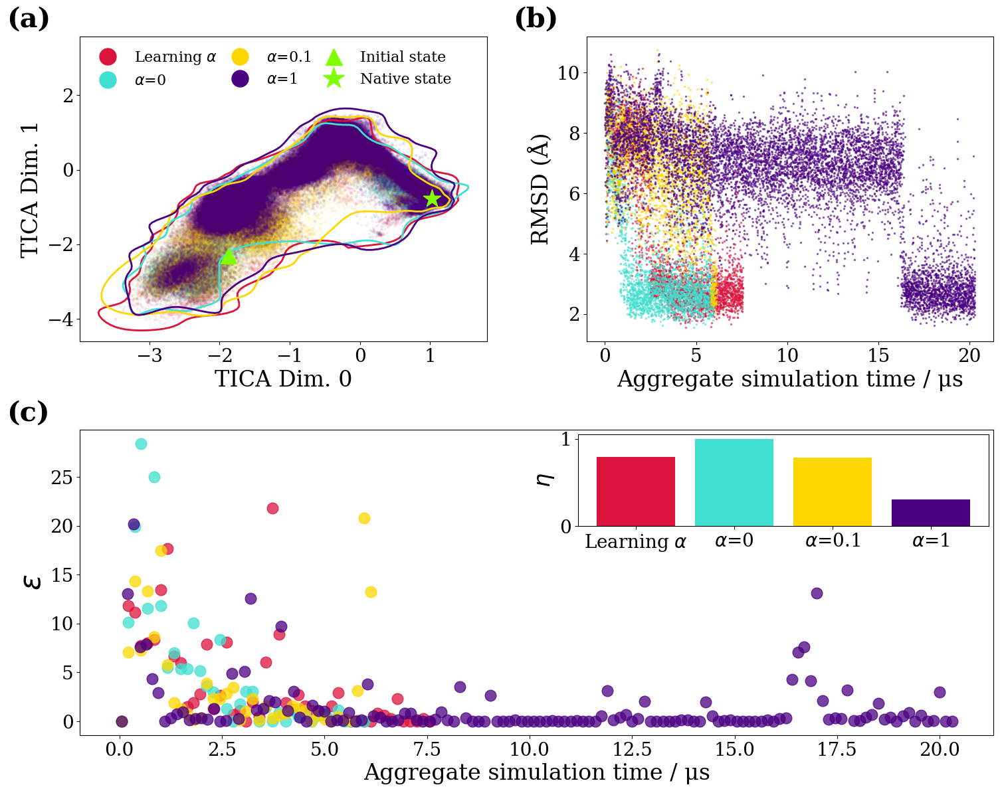

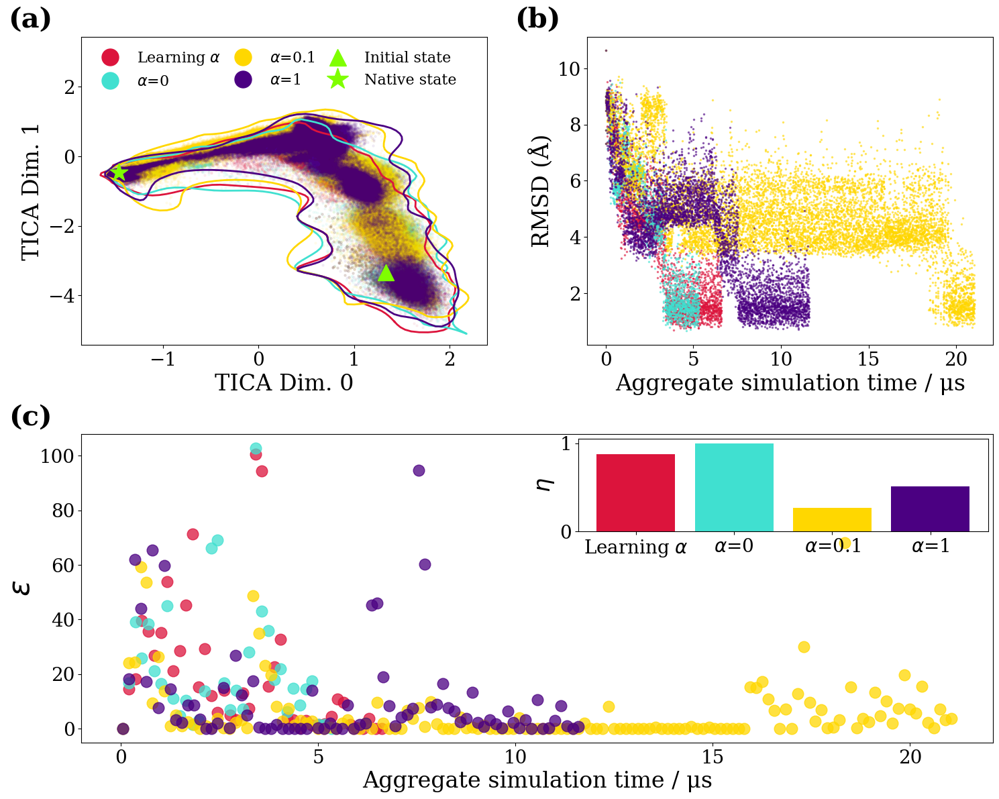

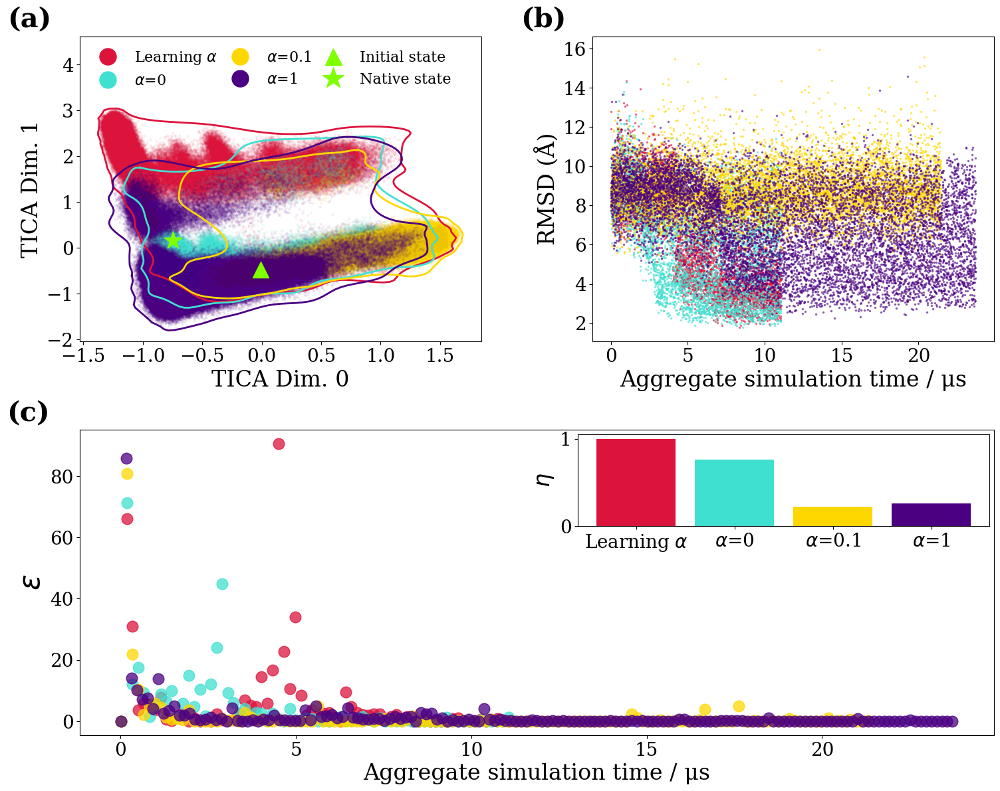

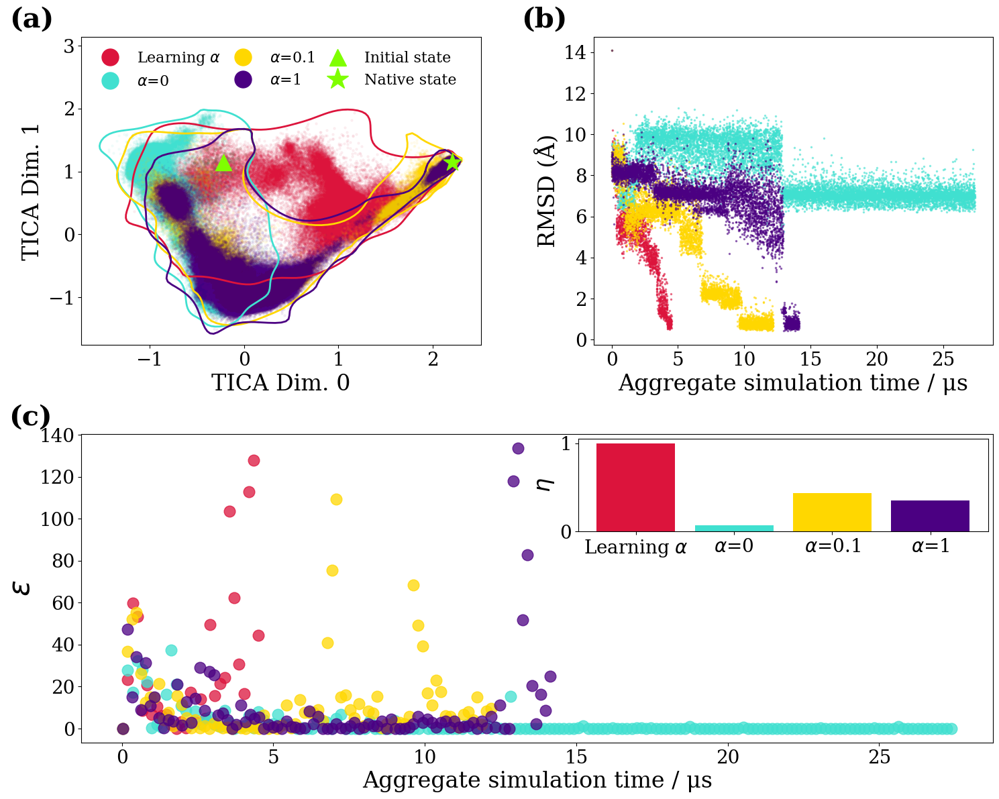

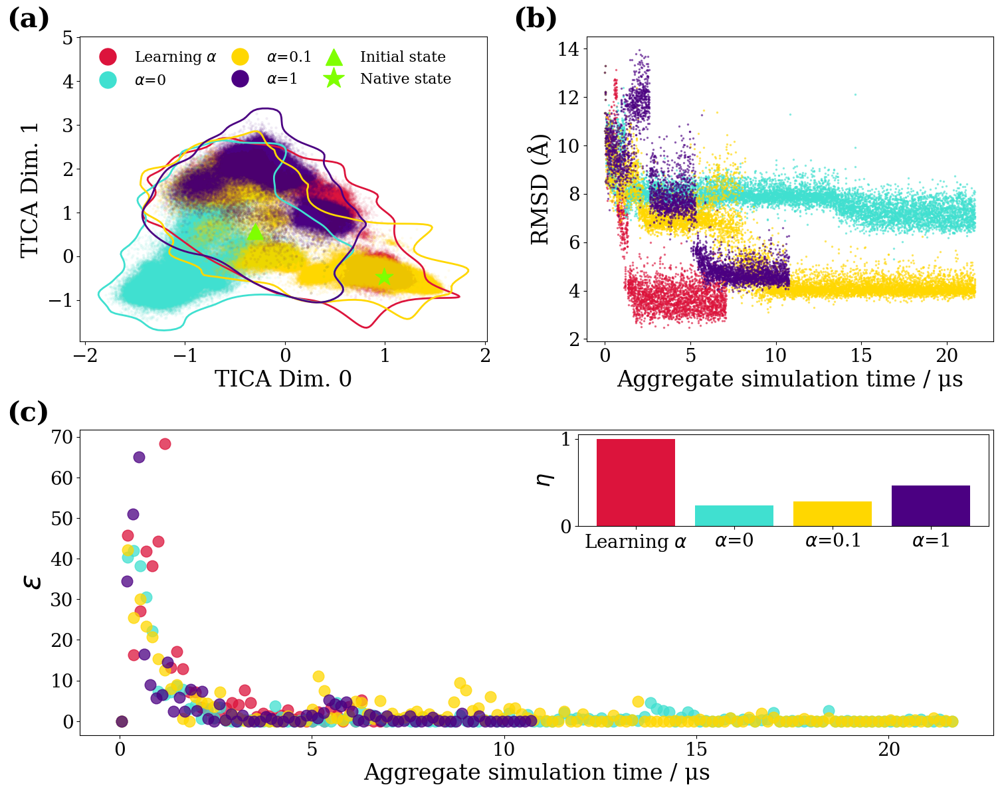

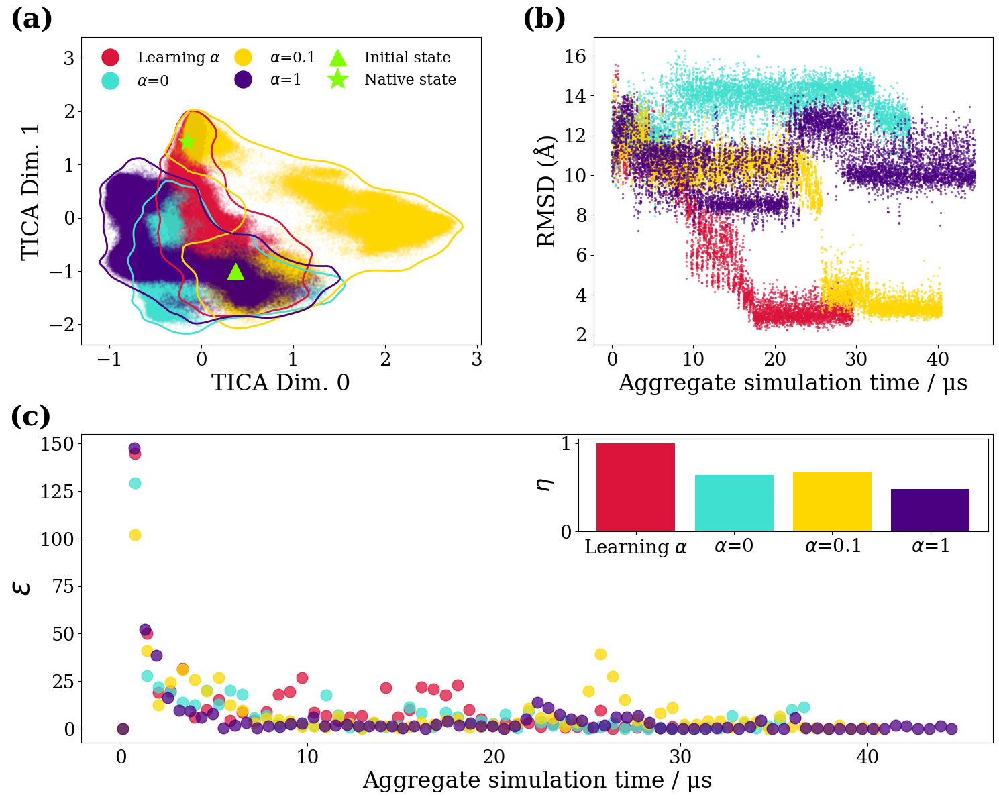

In [9]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import numpy as np

plt.rcParams["font.family"] = "serif"
for th_num_pro in range(6):

    fig = plt.figure(constrained_layout=True, figsize=(15, 12))
    # 使用GridSpec创建一个2x4的网格
    gs = gridspec.GridSpec(2, 2, figure=fig)
    # 在第一行的第一个位置画图
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.scatter(all_alpha_tics[th_num_pro][:AC_lens[th_num_pro],0], all_alpha_tics[th_num_pro][:AC_lens[th_num_pro],1], label=r'Learning $\alpha$', c='Crimson', s=5, alpha=0.05)
    # 绘制平滑的轮廓线
    ax1.plot(alpha_smooth_points[th_num_pro][0][:, 0], alpha_smooth_points[th_num_pro][0][:, 1], color='Crimson', linewidth=2)

    ax1.scatter(all_alpha_tics[th_num_pro][AC_lens[th_num_pro]:AC0_lens[th_num_pro],0], all_alpha_tics[th_num_pro][AC_lens[th_num_pro]:AC0_lens[th_num_pro],1], label=r'$\alpha$=0', c='Turquoise', s=5, alpha=0.05)
    # 绘制平滑的轮廓线
    ax1.plot(alpha_smooth_points[th_num_pro][1][:, 0], alpha_smooth_points[th_num_pro][1][:, 1], color='Turquoise', linewidth=2)

    ax1.scatter(all_alpha_tics[th_num_pro][AC0_lens[th_num_pro]:AC01_lens[th_num_pro],0], all_alpha_tics[th_num_pro][AC0_lens[th_num_pro]:AC01_lens[th_num_pro],1], label=r'$\alpha$=0.1', c='Gold', s=5, alpha=0.05)
    # 绘制平滑的轮廓线
    ax1.plot(alpha_smooth_points[th_num_pro][2][:, 0], alpha_smooth_points[th_num_pro][2][:, 1], color='Gold', linewidth=2)

    ax1.scatter(all_alpha_tics[th_num_pro][AC01_lens[th_num_pro]:AC1_lens[th_num_pro],0], all_alpha_tics[th_num_pro][AC01_lens[th_num_pro]:AC1_lens[th_num_pro],1], label=r'$\alpha$=1', c='Indigo', s=5, alpha=0.05)
    # 绘制平滑的轮廓线
    ax1.plot(alpha_smooth_points[th_num_pro][3][:, 0], alpha_smooth_points[th_num_pro][3][:, 1], color='Indigo', linewidth=2)

    #绘制初始构象点
    ax1.scatter(all_alpha_tics[th_num_pro][0,0], all_alpha_tics[th_num_pro][0,1], label='Initial state', c='Chartreuse', s=300, marker='^', zorder=10)
    # 绘制天然态点
    ax1.scatter(all_alpha_tics[th_num_pro][-1,0], all_alpha_tics[th_num_pro][-1,1], label='Native state', c='Chartreuse', s=400, marker='*', zorder=10)
    ax1.set_xlabel('TICA Dim. 0', fontsize=24)
    ax1.set_ylabel('TICA Dim. 1', fontsize=24)
    legend_alpha = mlines.Line2D([], [], color='Crimson', marker='o', linestyle='None', markersize=18, label=r'Learning $\alpha$', alpha=1.0)
    legend_alpha0 = mlines.Line2D([], [], color='Turquoise', marker='o', linestyle='None', markersize=18, label=r'$\alpha$=0', alpha=1.0)
    legend_alpha01 = mlines.Line2D([], [], color='Gold', marker='o', linestyle='None', markersize=18, label=r'$\alpha$=0.1', alpha=1.0)
    legend_alpha1 = mlines.Line2D([], [], color='Indigo', marker='o', linestyle='None', markersize=18, label=r'$\alpha$=1', alpha=1.0)
    legend_initial = mlines.Line2D([], [], color='Chartreuse', marker='^', linestyle='None', markersize=18, label='Initial state', alpha=1.0)
    legend_native = mlines.Line2D([], [], color='Chartreuse', marker='*', linestyle='None', markersize=24, label='Native state', alpha=1.0)
    ax1.legend(handles=[legend_alpha, legend_alpha0, legend_alpha01, legend_alpha1, legend_initial, legend_native], loc='upper left', framealpha=0.0, fontsize=16, ncol=3, columnspacing=0.5)
    ylims = ax1.get_ylim()
    new_ylims = (ylims[0], ylims[1] + (ylims[1] - ylims[0]) * 0.25)  # 在原有基础上增加15%的空间
    ax1.set_ylim(new_ylims)
    ax1.tick_params(axis='both', labelsize=20)

    # 在第一行的第二个位置画图
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(RMSD[th_num_pro][0], RMSD[th_num_pro][1]*10, label=r'Learning $\alpha$', marker='o', linestyle='-', markersize=1.5, linewidth=0, color='Crimson', alpha=0.5)
    ax2.plot(RMSD0[th_num_pro][0], RMSD0[th_num_pro][1]*10, label=r'$\alpha$=0', marker='o', linestyle='-', markersize=1.5, linewidth=0, color='Turquoise', alpha=0.5)
    ax2.plot(RMSD01[th_num_pro][0], RMSD01[th_num_pro][1]*10, label=r'$\alpha$=0.1', marker='o', linestyle='-', markersize=1.5, linewidth=0, color='Gold', alpha=0.5)
    ax2.plot(RMSD1[th_num_pro][0], RMSD1[th_num_pro][1]*10, label=r'$\alpha$=1', marker='o', linestyle='-', markersize=1.5, linewidth=0, color='Indigo', alpha=0.5)
    ax2.set_xlabel('Aggregate simulation time / μs', fontsize=24)
    ax2.set_ylabel('RMSD (Å)', fontsize=24)
    ax2.tick_params(axis='both', labelsize=20)

    # # 在第二行的第一个位置画图
    ax3 = fig.add_subplot(gs[1, 0:2])
    ax3.plot(time_per_round[th_num_pro][0], EPSILON[th_num_pro], label=r'Learning $\alpha$', marker='o', markersize=12, linewidth=0, color='Crimson', alpha=0.75)
    ax3.plot(time_per_round[th_num_pro][1], EPSILON0[th_num_pro], label=r'$\alpha$=0', marker='o', markersize=12, linewidth=0, color='Turquoise', alpha=0.75)
    ax3.plot(time_per_round[th_num_pro][2], EPSILON01[th_num_pro], label=r'$\alpha$=0.1', marker='o', markersize=12, linewidth=0, color='Gold', alpha=0.75)
    ax3.plot(time_per_round[th_num_pro][3], EPSILON1[th_num_pro], label=r'$\alpha$=1', marker='o', markersize=12, linewidth=0, color='Indigo', alpha=0.75)
    ax3.set_xlabel('Aggregate simulation time / μs', fontsize=24)
    ax3.set_ylabel(r'$\epsilon$', fontsize=32)
    ax3.tick_params(axis='both', labelsize=20)
    
    # 创建一个子图
    ax3_inset = inset_axes(ax3, width="45%", height="30%", loc='upper right')
    effective = np.sum(EPSILON[th_num_pro])/np.max(time_per_round[th_num_pro][0])
    effective0 = np.sum(EPSILON0[th_num_pro])/np.max(time_per_round[th_num_pro][1])
    effective01 = np.sum(EPSILON01[th_num_pro])/np.max(time_per_round[th_num_pro][2])
    effective1 = np.sum(EPSILON1[th_num_pro])/np.max(time_per_round[th_num_pro][3])
    eff = np.array([effective, effective0, effective01, effective1])
    EFF = eff/np.max(eff)
    labels = [r'Learning $\alpha$', r'$\alpha$=0', r'$\alpha$=0.1', r'$\alpha$=1']
    ax3_inset.bar(labels, EFF, color=['Crimson', 'Turquoise', 'Gold', 'Indigo'])
    ax3_inset.set_ylabel(r'$\eta$', fontsize=24)
    ax3_inset.tick_params(axis='both', labelsize=20)
    
    # 在ax1上添加标签(a)
    ax1.text(-0.18, 1.03, '(a)', transform=ax1.transAxes, size=30, weight='bold')
    # 在ax2上添加标签(b)
    ax2.text(-0.18, 1.03, '(b)', transform=ax2.transAxes, size=30, weight='bold')
    # 在ax3上添加标签(c)
    ax3.text(-0.08, 1.03, '(c)', transform=ax3.transAxes, size=30, weight='bold')

    plt.tight_layout()

    plt.savefig('ALPHA_'+protein_lst[th_num_pro].upper()+'.jpg', dpi=500)
    plt.savefig('ALPHA_'+protein_lst[th_num_pro].upper()+'.png', dpi=100)

In [10]:
def compute_rmsd(dir, protein_name, alpha, RMSD, dt, stride=10):
    ref = md.load_pdb(dir + protein_name + '/alpha0/p.pdb')
    alpha_indices = ref.topology.select_atom_indices('alpha')
    if alpha == '':
        file_path = dir + protein_name + '/' + protein_name + '.dcd'
    else:
        file_path = dir + protein_name + '/alpha' + alpha + '/' + protein_name + '.dcd'
    traj = md.load_dcd(file_path, top=dir + protein_name + '/alpha0/p.pdb')
    # print(traj)
    rmsd = md.rmsd(traj, ref, atom_indices=alpha_indices)*10
    print('rmsd.shape=',rmsd.shape)
    x = np.arange(len(rmsd))[::stride]*dt
    RMSD.append([x,rmsd[::stride]])
    del traj
    
RMSD = []
RMSD0 = []
RMSD01 = []
RMSD1 = []
dir = './data/'

for i,protein_name in enumerate(protein_lst):
    print('processing ', protein_name)
    
    #compute RMSD
    compute_rmsd(dir, protein_name, '', RMSD, dts[i], stride=1)
    compute_rmsd(dir, protein_name, '0', RMSD0, dts[i], stride=1)
    compute_rmsd(dir, protein_name, '0.1', RMSD01, dts[i], stride=1)
    compute_rmsd(dir, protein_name, '1', RMSD1, dts[i], stride=1)

best_rmsd = np.array([[np.min(RMSD[i][1]) for i in range(6)]])
best_rmsd0 = np.array([[np.min(RMSD0[i][1]) for i in range(6)]])
best_rmsd01 = np.array([[np.min(RMSD01[i][1]) for i in range(6)]])
best_rmsd1 = np.array([[np.min(RMSD1[i][1]) for i in range(6)]])
best_RMSD = np.concatenate((best_rmsd,best_rmsd0,best_rmsd01,best_rmsd1),axis=0).T

processing  1fme
rmsd.shape= (302800,)
rmsd.shape= (238800,)
rmsd.shape= (245200,)
rmsd.shape= (812000,)
processing  2f4k
rmsd.shape= (264400,)
rmsd.shape= (213200,)
rmsd.shape= (842000,)
rmsd.shape= (464000,)
processing  2f21
rmsd.shape= (442400,)
rmsd.shape= (442400,)
rmsd.shape= (858400,)
rmsd.shape= (948800,)
processing  2hba
rmsd.shape= (180400,)
rmsd.shape= (1095600,)
rmsd.shape= (487200,)
rmsd.shape= (565200,)
processing  2p6j
rmsd.shape= (283600,)
rmsd.shape= (866000,)
rmsd.shape= (866000,)
rmsd.shape= (430800,)
processing  2a3d
rmsd.shape= (591200,)
rmsd.shape= (732000,)
rmsd.shape= (808800,)
rmsd.shape= (890400,)


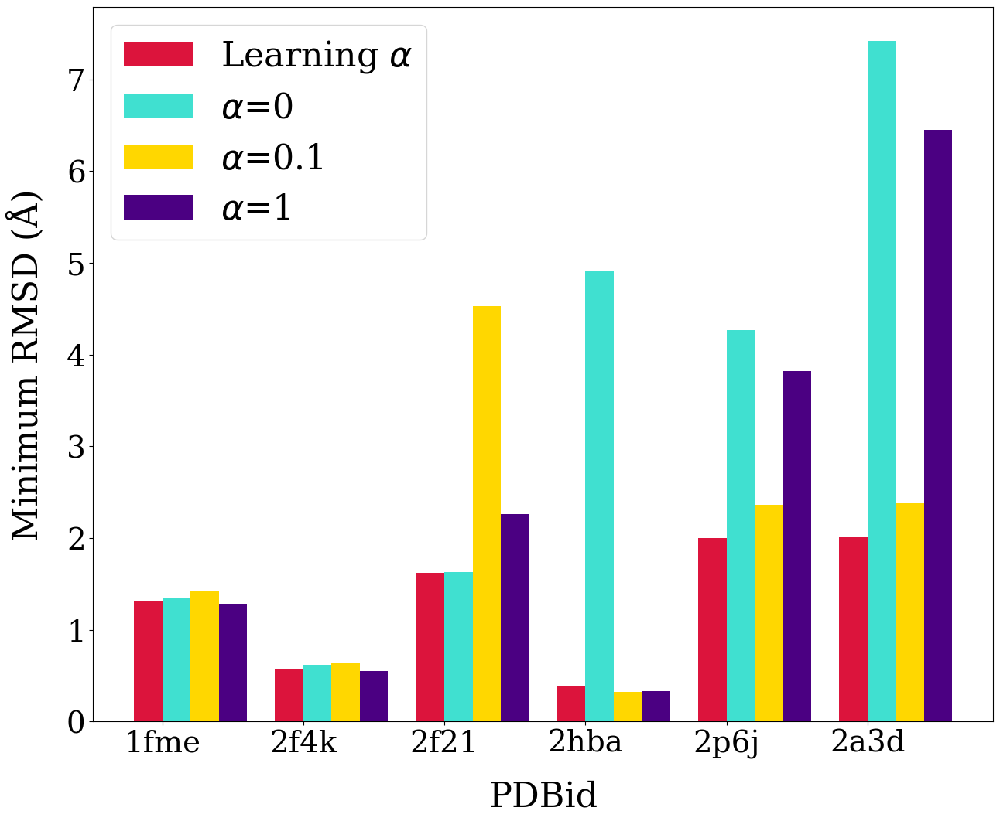

In [11]:
import numpy as np
import matplotlib.pyplot as plt

labels = ['1fme', '2f4k', '2f21', '2hba', '2p6j', '2a3d']
alpha_labels = [r'Learning $\alpha$', r'$\alpha$=0', r'$\alpha$=0.1', r'$\alpha$=1']
colors = ['Crimson', 'Turquoise', 'Gold', 'Indigo']

x = np.arange(len(labels))  # 标签位置
width = 0.2  # 柱子的宽度

fig, ax = plt.subplots(figsize=(15, 12))

# 对于每一类，创建一个柱状图
for i in range(4):
    ax.bar(x - width/2 + i*width, best_RMSD[:, i], width, label=alpha_labels[i], color=colors[i])

# 添加标签、标题和图例
ax.set_xlabel('PDBid', fontsize=32, labelpad=20)
ax.set_ylabel('Minimum RMSD (Å)', fontsize=32, labelpad=20)
ax.tick_params(axis='both', labelsize=28)
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend(fontsize=32)

# 显示图形
# plt.show()

plt.savefig('ALPHA_minRMSD.jpg', dpi=500)
plt.savefig('ALPHA_minRMSD.png', dpi=100)

In [11]:
W[3].shape

(29, 52)

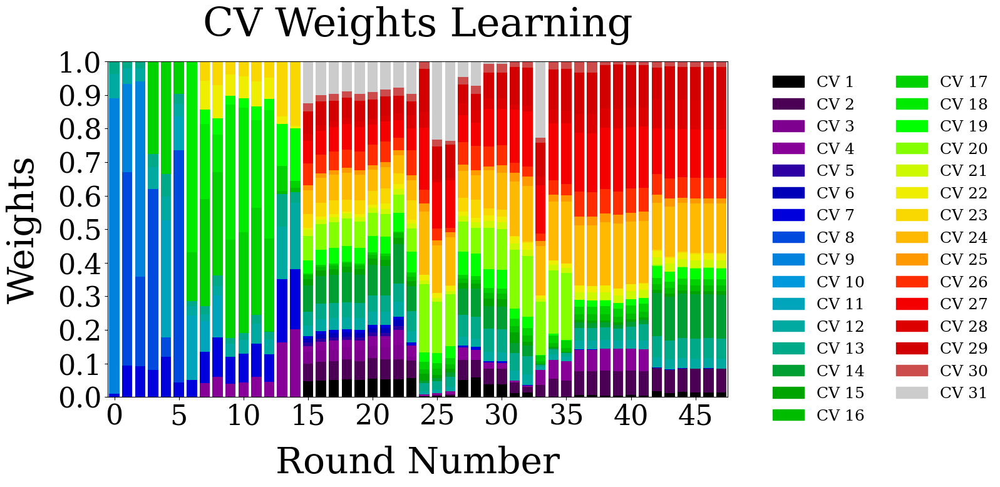

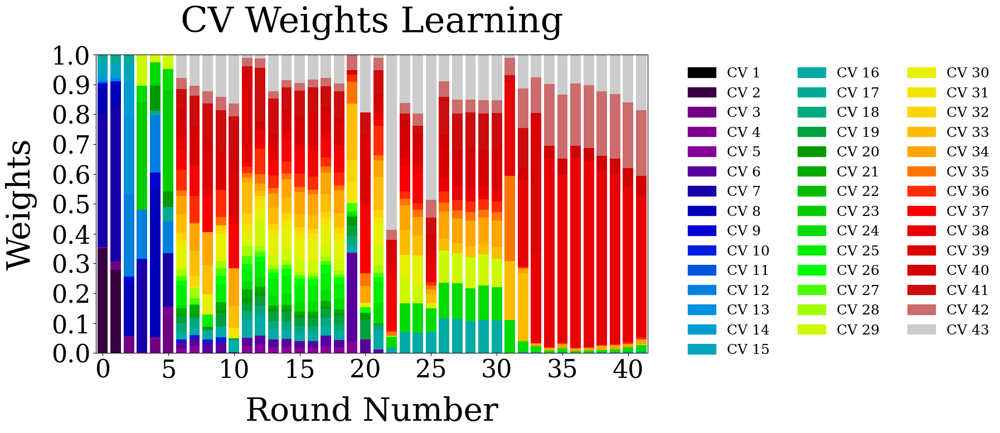

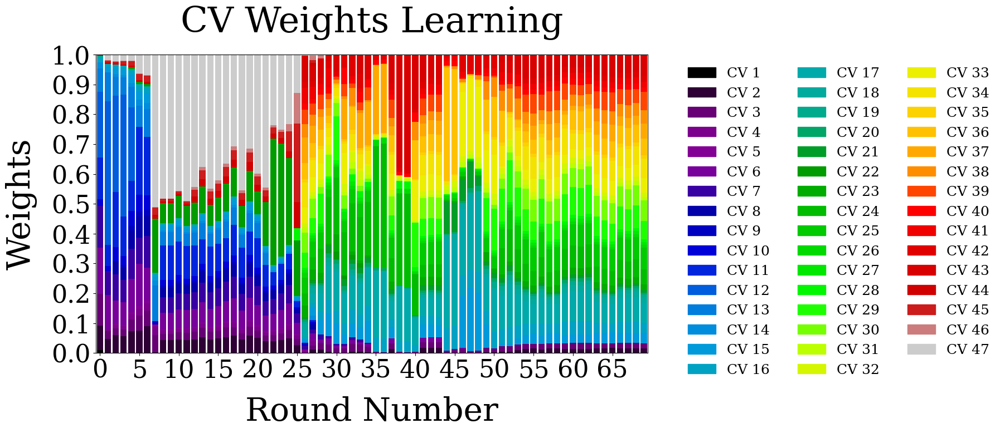

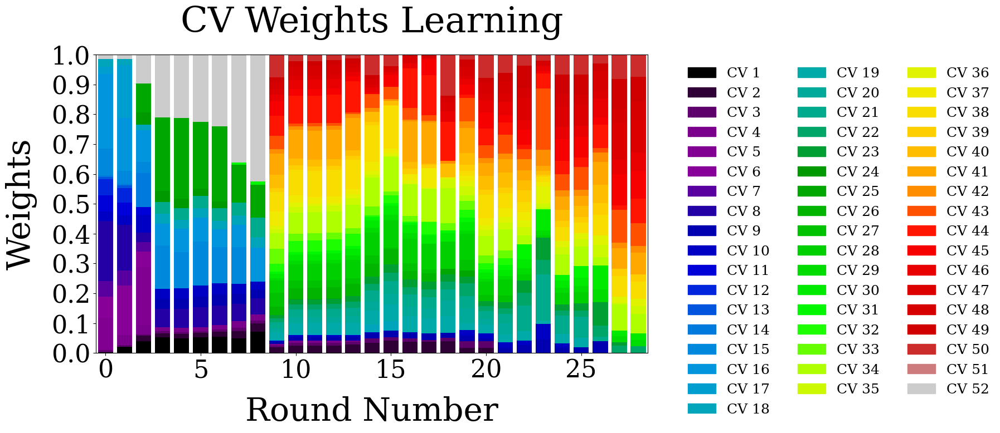

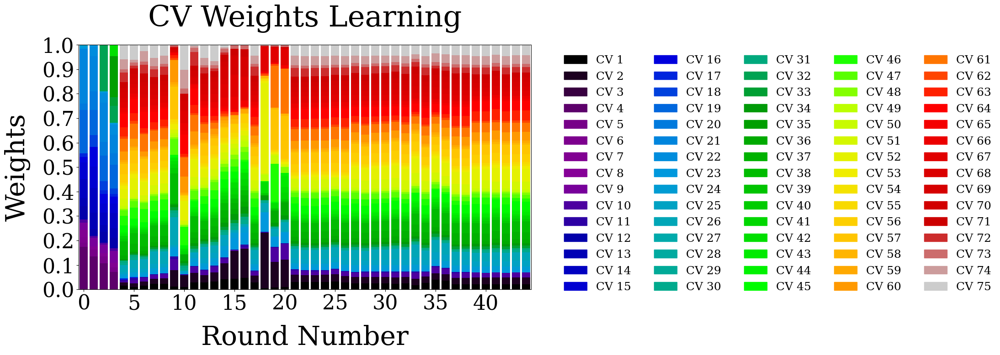

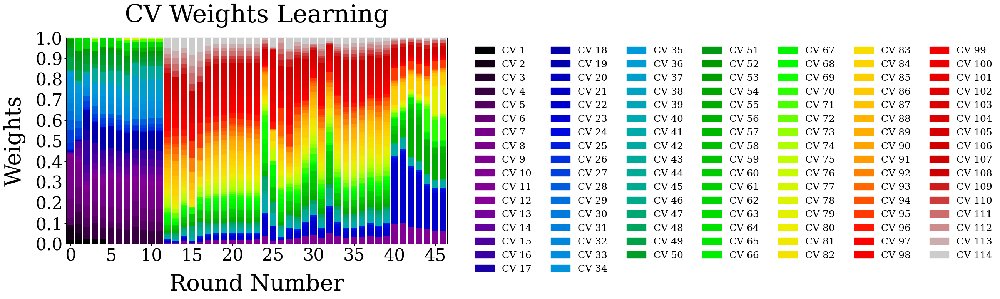

In [174]:
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["font.family"] = "serif"

colors_RGB = []
for th_num_pro in range(6):
    # 创建一个颜色列表，包含52种不同的颜色
    n_CVs = W[th_num_pro].shape[1]
    n_rounds = W[th_num_pro].shape[0]
    colors = plt.cm.nipy_spectral(np.linspace(0, 1, n_CVs))  # 使用nipy_spectral颜色映射以提高色块之间的对比度
    colors_RGB.append((colors[:, :3] * 255).astype(int))

    # 创建一个标签列表，包含29个不同的标签
    labels = np.arange(n_rounds)

    # 创建一个图形
    fig, ax = plt.subplots(figsize=(18, 8))

    # 对于W中的每一列，创建一个堆叠的柱状图
    for i in range(n_CVs):
        ax.bar(labels, W[th_num_pro][:, i], bottom=np.sum(W[th_num_pro][:, :i], axis=1), color=colors[i])

    # 创建图例
    handles = [plt.Rectangle((0,0),1,1, color=colors[i]) for i in range(n_CVs)]
    ncol = round(n_CVs/16)
    ax.legend(handles, [f'CV {i+1}' for i in range(n_CVs)], bbox_to_anchor=(1.05, 1), loc='upper left', ncol=ncol, framealpha=0.0, fontsize=18)  # 设置ncol=3使图例按照3列显示

    # 设置x轴和y轴的标签
    ax.set_xlabel('Round Number', fontsize=42, labelpad=18)
    ax.set_ylabel('Weights', fontsize=42, labelpad=18)

    # 设置x轴和y轴的刻度
    ax.set_xticks(np.arange(0, n_rounds, 5))  # 设置x轴的刻度为0, 5, 10, ..., 25
    ax.set_yticks(np.arange(0, 1.1, 0.1))  # 设置y轴的刻度为0.0, 0.1, 0.2, ..., 1.0

    # 设置刻度值的大小
    ax.tick_params(axis='both', labelsize=32)
    ax.set_xlim(-0.5, n_rounds-0.5)
    ax.set_title('CV Weights Learning', fontsize=46, y=1.06)

    plt.subplots_adjust(bottom=0.18, top=0.85, left=0.1, right=0.65)  # Adjust the top of the subplots to make room for the legend and labels

    # 显示图形
    plt.show()

    # plt.savefig('CVweights_evolution_'+protein_lst[th_num_pro]+'.png', dpi=100)

In [23]:
import pickle
with open('colors_RGB.pkl', 'wb') as f:
    pickle.dump(colors_RGB, f)

In [35]:
# 创建一个字典，其中键是氨基酸的全称，值是氨基酸的简称
amino_acid_dict = {
    'ALA': 'A',
    'ARG': 'R',
    'ASN': 'N',
    'ASP': 'D',
    'CYS': 'C',
    'GLU': 'E',
    'GLN': 'Q',
    'GLY': 'G',
    'HIS': 'H',
    'ILE': 'I',
    'LEU': 'L',
    'LYS': 'K',
    'MET': 'M',
    'PHE': 'F',
    'PRO': 'P',
    'SER': 'S',
    'THR': 'T',
    'TRP': 'W',
    'TYR': 'Y',
    'VAL': 'V'
}
full_name_sequences = ['GLU-GLN-TYR-THR-ALA-LYS-TYR-LYS-GLY-ARG-THR-PHE-ARG-ASN-GLU-LYS-GLU-LEU-ARG-ASP-PHE-ILE-GLU-LYS-PHE-LYS-GLY-ARG',
                      'LEU-SER-ASP-GLU-ASP-PHE-LYS-ALA-VAL-PHE-GLY-MET-THR-ARG-SER-ALA-PHE-ALA-ASN-LEU-PRO-LEU-TRP-LEU-GLN-GLN-HIS-LEU-LEU-LYS-GLU-LYS-GLY-LEU-PHE',
                      'GLY-SER-LYS-LEU-PRO-PRO-GLY-TRP-GLU-LYS-ARG-MET-SER-ARG-ASP-GLY-ARG-VAL-TYR-TYR-PHE-ASN-HIS-ILE-THR-GLY-THR-THR-GLN-PHE-GLU-ARG-PRO-SER-GLY',
                      'MET-LYS-VAL-ILE-PHE-LEU-LYS-ASP-VAL-LYS-GLY-MET-GLY-LYS-LYS-GLY-GLU-ILE-LYS-ASN-VAL-ALA-ASP-GLY-TYR-ALA-ASN-ASN-PHE-LEU-PHE-LYS-GLN-GLY-LEU-ALA-ILE-GLU-ALA',
                      'MET-LYS-GLN-TRP-SER-GLU-ASN-VAL-GLU-GLU-LYS-LEU-LYS-GLU-PHE-VAL-LYS-ARG-HIS-GLN-ARG-ILE-THR-GLN-GLU-GLU-LEU-HIS-GLN-TYR-ALA-GLN-ARG-LEU-GLY-LEU-ASN-GLU-GLU-ALA-ILE-ARG-GLN-PHE-PHE-GLU-GLU-PHE-GLU-GLN-ARG-LYS',
                      'MET-GLY-SER-TRP-ALA-GLU-PHE-LYS-GLN-ARG-LEU-ALA-ALA-ILE-LYS-THR-ARG-LEU-GLN-ALA-LEU-GLY-GLY-SER-GLU-ALA-GLU-LEU-ALA-ALA-PHE-GLU-LYS-GLU-ILE-ALA-ALA-PHE-GLU-SER-GLU-LEU-GLN-ALA-TYR-LYS-GLY-LYS-GLY-ASN-PRO-GLU-VAL-GLU-ALA-LEU-ARG-LYS-GLU-ALA-ALA-ALA-ILE-ARG-ASP-GLU-LEU-GLN-ALA-TYR-ARG-HIS-ASN'
                        ]

# 将氨基酸序列的全称转换为简称
short_name_sequences = [''.join(amino_acid_dict[aa] for aa in sequence.split('-')) for sequence in full_name_sequences]
# print('short_name_sequences = ', short_name_sequences)
for i in range(6):
    print('The length of', protein_lst[i].upper(), 'is',len(short_name_sequences[i]),';','sequence:',short_name_sequences[i])

The length of 1FME is 28 ; sequence: EQYTAKYKGRTFRNEKELRDFIEKFKGR
The length of 2F4K is 35 ; sequence: LSDEDFKAVFGMTRSAFANLPLWLQQHLLKEKGLF
The length of 2F21 is 35 ; sequence: GSKLPPGWEKRMSRDGRVYYFNHITGTTQFERPSG
The length of 2HBA is 39 ; sequence: MKVIFLKDVKGMGKKGEIKNVADGYANNFLFKQGLAIEA
The length of 2P6J is 52 ; sequence: MKQWSENVEEKLKEFVKRHQRITQEELHQYAQRLGLNEEAIRQFFEEFEQRK
The length of 2A3D is 73 ; sequence: MGSWAEFKQRLAAIKTRLQALGGSEAELAAFEKEIAAFESELQAYKGKGNPEVEALRKEAAAIRDELQAYRHN


In [129]:
class CVgenerator:
    # initialization
    def __init__(self, pdb_structure, windows_size='auto', steps='auto', mode='regular'):
        self.struc = pdb_structure
        struc = md.load_pdb(pdb_structure)
        n_residues = struc.topology.n_residues
        if windows_size=='auto' and steps=='auto':
            self.windows_size = np.arange(5,n_residues,4)
            self.steps = np.round(self.windows_size/2).astype(int)
            # self.steps = np.array([2]*self.windows_size.shape[0])
            if self.windows_size[-1]!=n_residues:
                self.windows_size = np.append(self.windows_size,n_residues)
                self.steps = np.append(self.steps,n_residues)
            
        else:
            self.windows_size = windows_size
            self.steps = steps

        self.mode = mode
        
    def generateCV(self):
        struc = md.load_pdb(self.struc)
        n_residues = struc.topology.n_residues
        ref_dssp_code = md.compute_dssp(struc, simplified=False)
        flag_alpha = False
        flag_beta = False
        alpha_res_index = np.where(ref_dssp_code[0]=='H')
        if alpha_res_index[0].shape[0]>0:
            alpha_res = extract_consecutive_parts(alpha_res_index[0])
            flag_alpha = True
        beta_res_index = np.where(ref_dssp_code[0]=='E')
        if beta_res_index[0].shape[0]>0:
            beta_res = extract_consecutive_parts(beta_res_index[0])
            flag_beta = True
        heavy = struc.topology.select_atom_indices('heavy')
        alpha = struc.topology.select_atom_indices('alpha')
        important_atoms = heavy
        CV_indices = []
        CV_residues_index = []
        CV_struc_indices = []
        exclude_beta_strand = False
        if self.mode=='regular':
            if exclude_beta_strand:
                arr_scope = np.where(ref_dssp_code[0]!='E')[0]
                arrs_in = extract_consecutive_parts(arr_scope)
                filt_arrs_in = [i for i in arrs_in if i.shape[0]>3]
                for size,step in zip(self.windows_size,self.steps):
                    arrs_out = []
                    for arr in filt_arrs_in:
                        arrs_out += self.generate_sliding_windows(arr,size,step)
                    for ress in arrs_out:
                        resi_indices = struc.topology.select('resi '+' '.join(str(i) for i in ress))
                        if not any(np.array_equal(resi_indices, arr) for arr in CV_struc_indices):
                            CV_struc_indices.append(resi_indices)
                        sel_indices = np.intersect1d(important_atoms,resi_indices)
                        if not any(np.array_equal(sel_indices, arr) for arr in CV_indices):
                            CV_indices.append(sel_indices)
                            CV_residues_index.append(ress)
            else:
                arrs_in = np.arange(n_residues)
                for size,step in zip(self.windows_size,self.steps):
                    arrs_out = self.generate_sliding_windows(arrs_in,size,step)
                    for ress in arrs_out:
                        resi_indices = struc.topology.select('resi '+' '.join(str(i) for i in ress))
                        if not any(np.array_equal(resi_indices, arr) for arr in CV_struc_indices):
                            CV_struc_indices.append(resi_indices)
                        sel_indices = np.intersect1d(important_atoms,resi_indices)
                        if not any(np.array_equal(sel_indices, arr) for arr in CV_indices):
                            CV_indices.append(sel_indices)
                            CV_residues_index.append(ress)
            if flag_beta:
                cv_indices, cv_struc_indices, cv_residues_index  = self.find_beta(struc, beta_res, important_atoms)
                CV_indices += cv_indices
                CV_residues_index += cv_residues_index
                CV_struc_indices += cv_struc_indices
            
        elif self.mode=='structure':            
            if flag_alpha:
                cv_indices, cv_struc_indices, cv_residues_index = self.find_alpha(struc, alpha_res, important_atoms)
                CV_indices += cv_indices
                CV_residues_index += cv_residues_index
                CV_struc_indices += cv_struc_indices
            if flag_beta:
                cv_indices, cv_struc_indices, cv_residues_index  = self.find_beta(struc, beta_res, important_atoms)
                CV_indices += cv_indices
                CV_residues_index += cv_residues_index
                CV_struc_indices += cv_struc_indices
        if not os.path.isdir('CV_structures'):
            os.mkdir('CV_structures')
            for n,indice in enumerate(CV_struc_indices):
                CV_struc = struc.atom_slice(indice)
                CV_struc.save_pdb('./CV_structures/CV_structure_'+str(n)+'.pdb')    

        return CV_indices, CV_residues_index
        
    def generate_sliding_windows(self, arr_in, window_size, step):
        if len(arr_in) <= window_size:
            arrs_out = [list(arr_in)]
        else:
            arrs_out = []
            for i in range(0, len(arr_in) - window_size + 1, step):
                window = arr_in[i:i+window_size]
                arrs_out.append(list(window))
            
            # Include the last window if it is not complete
            # if len(arr_in) % step != 0:
            #     window = arr_in[-window_size:]
            #     arrs_out.append(list(window))
            
            if arrs_out[-1][-1] != arr_in[-1]:
                window = arr_in[-window_size:]
                arrs_out.append(list(window))
        
        return arrs_out
    
    # def generate_sliding_windows(self, arr_in, window_size, step):
    #     if len(arr_in) <= window_size:
    #         lst_out = [list(arr_in)]
    #     else:
    #         lst_out = []
    #         arr_length = len(arr_in)
    #         start = 0
    #         while start < arr_length:
    #             end = start + window_size
    #             # Wrap around to the beginning if the end exceeds the array length
    #             if end > arr_length:
    #                 window = np.concatenate((arr_in[start:], arr_in[:end - arr_length]))
    #             else:
    #                 window = np.array(arr_in[start:end])
    #             lst_out.append(window.tolist())
    #             start += step
            
    #     return lst_out
    
    def find_alpha(self, struc, alpha_res, important_atoms):
        alpha_level_struc = []
        CV_indices = []
        CV_residues_index = []
        CV_struc_indices = []
        for size,step in zip(self.windows_size,self.steps):
            for ress in alpha_res:
                if size>=ress.shape[0]:
                    if any(np.array_equal(ress, np.array(arr)) for arr in alpha_level_struc):
                        continue
                    else:
                        alpha_level_struc.append(list(ress))
                else:
                    arrs_out = self.generate_sliding_windows(ress,size,step)
                    alpha_level_struc += arrs_out
        for single_alpha in alpha_res:
            if not any(np.array_equal(single_alpha, np.array(arr)) for arr in alpha_level_struc):
                alpha_level_struc.append(single_alpha)

        n_seg = len(alpha_res)
        if n_seg>=2:
            for seg in range(2,n_seg+1):
                for i in range(0,n_seg-seg+1):
                    window = np.arange(alpha_res[i][0],alpha_res[i+seg-1][-1]+1)
                    alpha_level_struc.append(list(window))
        alpha_indices = []
        for ress in alpha_level_struc:
            resi_indices = struc.topology.select('resi '+' '.join(str(i) for i in ress))
            CV_struc_indices.append(resi_indices)
            sel_indices = np.intersect1d(important_atoms,resi_indices)
            alpha_indices.append(sel_indices)
            CV_residues_index.append(ress)
        CV_indices += alpha_indices
        return CV_indices, CV_struc_indices, CV_residues_index
    
    def find_beta(self, struc, beta_res, important_atoms):
        hbonds_lst = md.baker_hubbard(struc,distance_cutoff=0.25)
        res2atom = []
        CV_indices = []
        CV_residues_index = []
        CV_struc_indices = []
        for i in range(struc.top.n_residues):
            at1 = struc.top.select('resid '+str(i))[0]
            at2 = struc.top.select('resid '+str(i))[-1]
            res2atom.append([at1,at2])
        # Create a list of coarse-grained hydrogen bonds represented by pairs of amino acids.
        res_hbonds = []
        for hbond in hbonds_lst:
            donor = hbond[0]
            acc = hbond[2]
            res_hbond = [0,0]
            for n,at in enumerate(res2atom):
                if at[0]<=donor<=at[1]:
                    res_hbond[0] = n
                elif at[0]<=acc<=at[1]:
                    res_hbond[1] = n
            res_hbonds.append(np.array(res_hbond))
        res_hbonds = np.array(res_hbonds)
        res_hbonds_beta = []    # coarse-grained hbond represented by residue pairs
        for hbond in res_hbonds:
            if sum(np.isin(np.concatenate(beta_res), hbond[0]))\
                and sum(np.isin(np.concatenate(beta_res), hbond[1])):
                res_hbonds_beta.append(hbond)
        beta_pair = []
        for pair in res_hbonds_beta:
            ind = [-1, -1]
            for n,lst in enumerate(beta_res):
                if sum(np.isin(lst,pair[0])):
                    ind[0] = n
                elif sum(np.isin(lst,pair[1])):
                    ind[1] = n
            beta_pair.append(np.sort(np.array(ind)))
        beta_pair = np.unique(beta_pair, axis=0)

        beta_strand_lens = [i.shape[0] for i in beta_res]
        max_beta_strand = np.max(beta_strand_lens)
        beta_windows_sizes = np.arange(4,max_beta_strand+2,2)
        beta_steps = np.round(beta_windows_sizes/2).astype(int)
        beta_level_struc = []
        for pair in beta_pair:
            # align the beta-strand, make them same length
            sel_segs = [beta_res[pair[0]],beta_res[pair[1]]]
            iden = [beta_res[pair[0]].shape[0],beta_res[pair[1]].shape[0]]
            if beta_res[pair[0]].shape[0] != beta_res[pair[1]].shape[0]:
                big_seg = sel_segs[np.argmax(iden)]
                small_seg = sel_segs[np.argmin(iden)]
                
                seg_len = small_seg.shape[0]
                segs = self.generate_sliding_windows(big_seg,seg_len,1)
                segs_dis = []
                for seg in segs:
                    import itertools
                    pairs = list(itertools.product(seg, small_seg))
                    distances = md.compute_contacts(struc, pairs)
                    segs_dis.append(np.mean(np.min(distances[0].reshape(seg_len,seg_len),axis=1)))
                sel_seg = segs[np.argmin(segs_dis)]
                sel_segs = [small_seg,sel_seg]
            # align the beta-strand, make them paralelle aligned
            pair_res_dis1 = md.compute_contacts(struc, [(sel_segs[0][0],sel_segs[1][0])])
            pair_res_dis2 = md.compute_contacts(struc, [(sel_segs[0][0],sel_segs[1][-1])])
            if pair_res_dis2 < pair_res_dis1:
                sel_segs[1] = sel_segs[1][::-1]
                
            
            for size,step in zip(beta_windows_sizes,beta_steps):
                if size>=sel_segs[0].shape[0]:
                    if any(np.array_equal(np.concatenate(sel_segs), np.array(arr)) for arr in beta_level_struc):
                            continue
                    else:
                        beta_level_struc.append(list(np.concatenate(sel_segs)))
                else:
                    arrs_out1 = self.generate_sliding_windows(sel_segs[0],size,step)
                    arrs_out2 = self.generate_sliding_windows(sel_segs[1],size,step)
                    beta_level_struc += [list(np.concatenate([arrs_out1[i],arrs_out2[i]])) for i in range(len(arrs_out1))]

        beta_indices = []
        for ress in beta_level_struc:
            resi_indices = struc.topology.select('resi '+' '.join(str(i) for i in ress))
            CV_struc_indices.append(resi_indices)
            sel_indices = np.intersect1d(important_atoms,resi_indices)
            beta_indices.append(sel_indices)
            CV_residues_index.append(ress)
        CV_indices += beta_indices
        return CV_indices, CV_struc_indices, CV_residues_index

In [130]:
import os
dir = './data/'
CVs_res_index = []
for i,protein_name in enumerate(protein_lst):
    ref_pdb_filename = dir + protein_name + '/p.pdb'
    cvgenerator_ts = CVgenerator(ref_pdb_filename,windows_size='auto',steps='auto',mode='regular')
    sel_indices, CV_residues_index = cvgenerator_ts.generateCV()
    CVs_res_index.append(CV_residues_index)

width: 7.0 ; high: 8.1


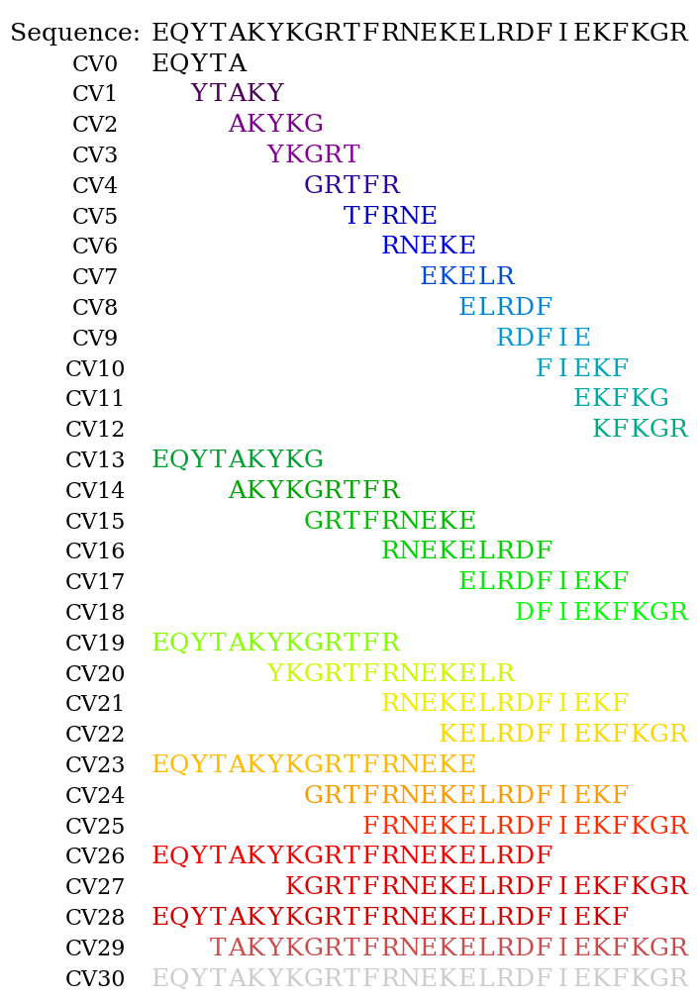

width: 8.75 ; high: 9.3


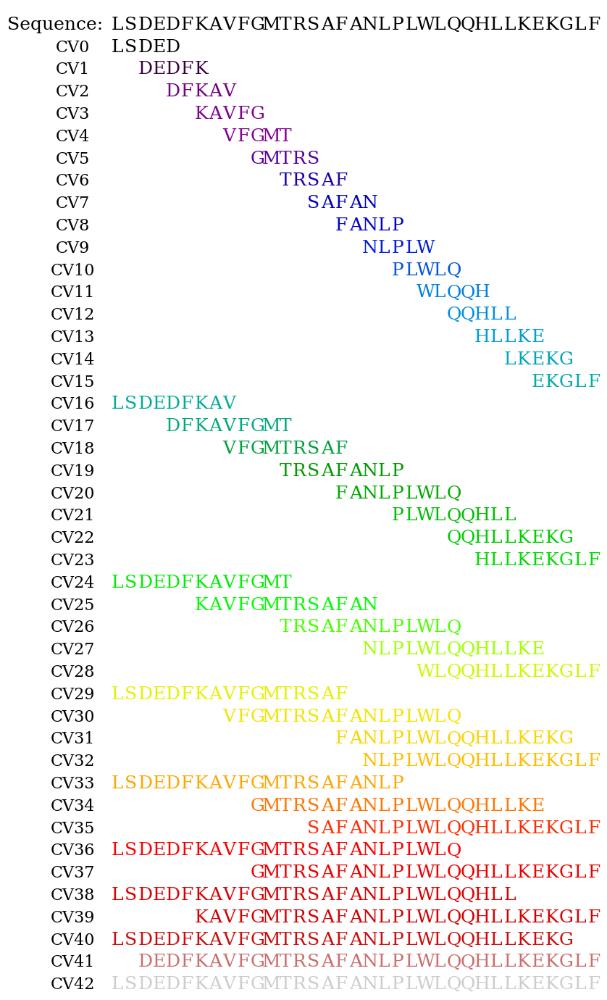

width: 8.75 ; high: 9.7


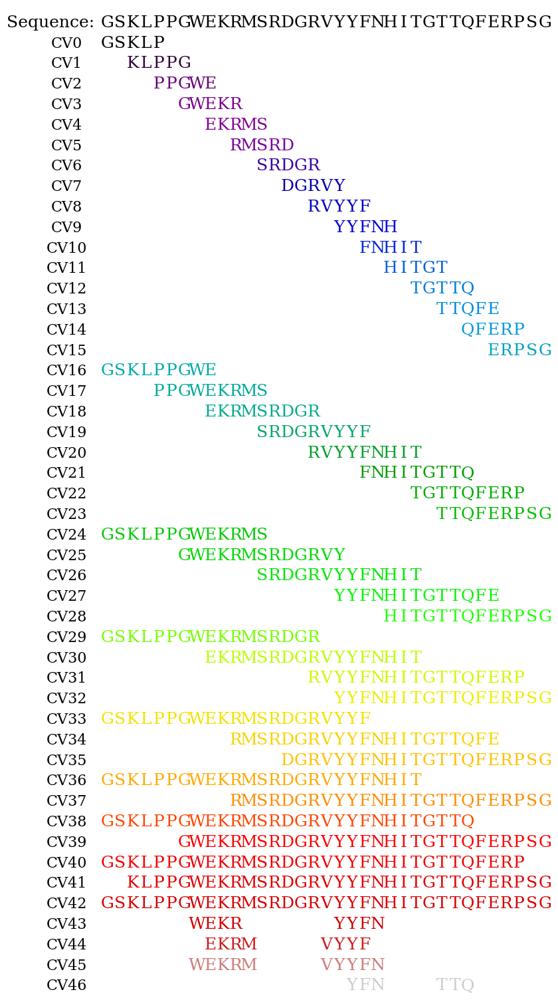

width: 9.75 ; high: 10.2


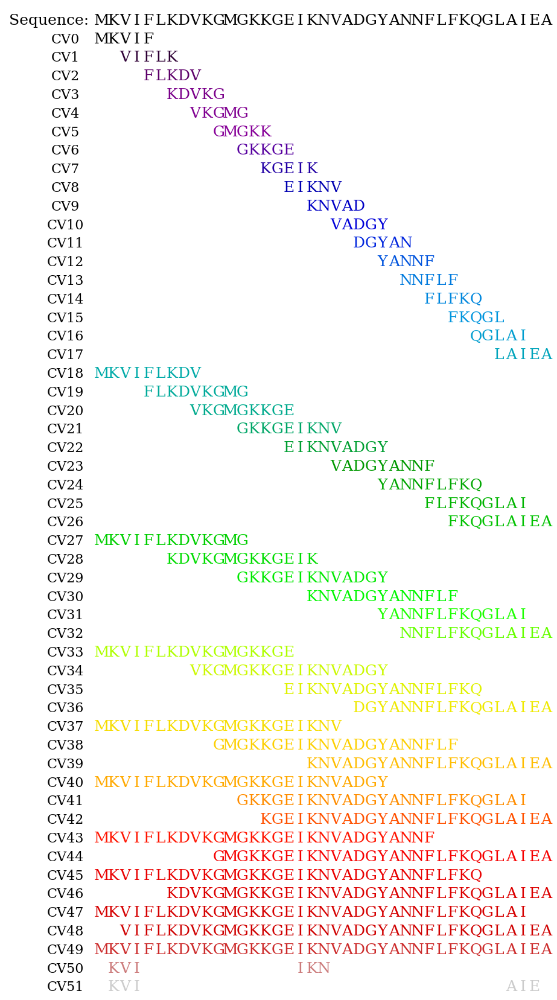

width: 13.0 ; high: 12.5


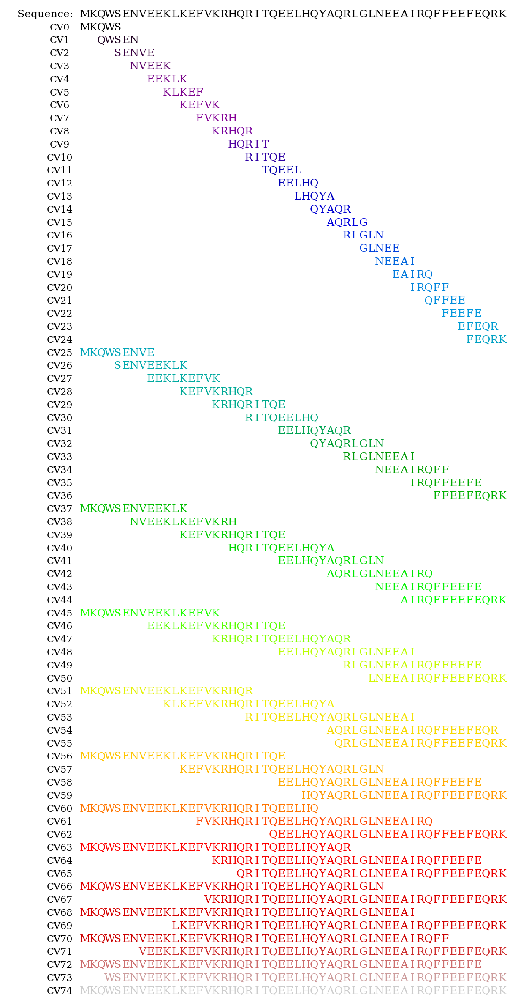

width: 18.25 ; high: 16.4


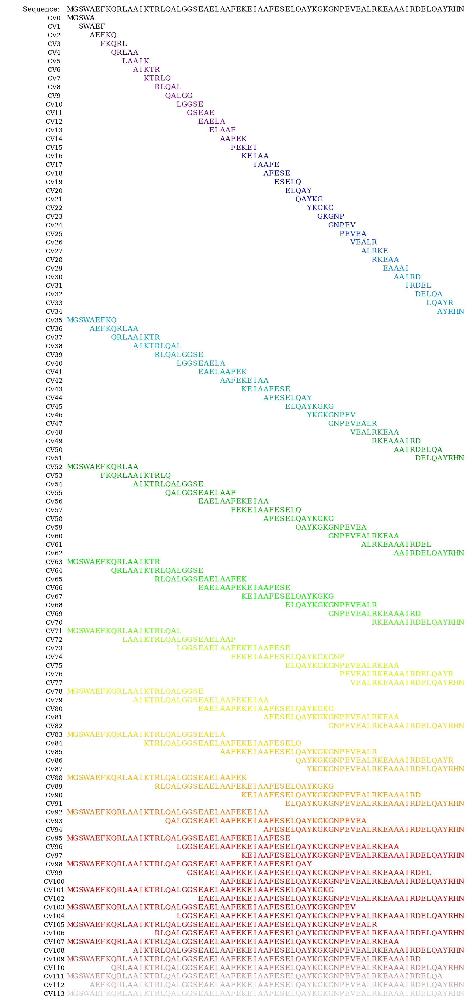

In [167]:
import matplotlib.pyplot as plt

# 获取要显示的文本
text = 'Sequence: '
gap = [0.25, 0.22, 0.22, 0.21, 0.19, 0.17]

letter_size = 18
for nth_pro in range(6):
    # 创建一个新的图形
    n_ress = len(short_name_sequences[nth_pro])
    width = n_ress*0.25
    high = 5+0.1*len(CVs_res_index[nth_pro])
    # fig, ax = plt.subplots(figsize=(width, high))
    fig, ax = plt.subplots(figsize=(width, 8))
    print('width:',width,';','high:',high)

    # 使用text函数在图上显示文本
    # 参数x和y是文本的位置，s是文本内容
    # 参数fontsize设置字体大小，color设置字体颜色
    ax.text(x=0.1, y=0.95, s=text, fontsize=letter_size, color='k', ha='center')
    for i, char in enumerate(short_name_sequences[nth_pro]):
        ax.text(x=gap[nth_pro]+i/len(short_name_sequences[nth_pro]), y=0.95, s=char, fontsize=letter_size, color='k', ha='center')

    # 遍历CVs_res_index[0]，并获取每个列表的索引和值
    for i, indices in enumerate(CVs_res_index[nth_pro]):
        ax.text(x=0.13, y=0.95-(i+1)*0.05, s='CV'+str(i), fontsize=letter_size-2, color='k', ha='center')
        # 从short_name_sequences[0]中获取对应的字符
        chars = [short_name_sequences[nth_pro][index] for index in indices]
        # string = ''.join(chars)
        # ax.text(x=0.68*indices[0]/len(short_name_sequences[0]), y=0.95-(i+1)*0.05, s=string, fontsize=12, color='k', ha='center')
        # 将RGB值转换为0到1的范围
        color = tuple(x/255 for x in colors_RGB[nth_pro][i])
        for j, char in enumerate(chars):
            ax.text(x=gap[nth_pro]+indices[j]/len(short_name_sequences[nth_pro]), y=0.95-(i+1)*0.05, s=char, fontsize=letter_size, color=color, ha='center')

    # 隐藏坐标轴
    ax.axis('off')
    
    # 显示图形
    plt.show()
    # plt.tight_layout()
    
    # plt.savefig('CVs_'+protein_lst[nth_pro]+'.png', dpi=100)